# 1. Motivation

We wanted to analyze a social network that we and a lot of people spend a lot of time on almost every day: Reddit.

Reddit can be called a forum aggregator, because it is a website that lets users create *subreddit*s, which are simply forums where users can share links, images, memes and have deep conversations.

The objective is providing insight into how communities of users are formed within and between popular subreddits, what makes a post successful and what is the correlation between the sentiment of the content and its score.

For this purpose, we focused on well-formed and active subreddits and picked their best content.

We do this by selecting the most active subreddits in 2019 (not exactly, but an approximation) using data from https://www.topsubreddits.com/ and historical versions using [WayBack Machine](https://archive.org/web/).
We then select the top 50 posts in the last year according to the algorithm from each subreddit. From each of these posts, we collect all the comments that a normal user visiting the post would likely read. This is done by using [PRAW](https://praw.readthedocs.io/en/latest/), which operates by using the Reddit API. When collecting comments what happens is very similar to what a user does when they navigate through a post: all the comments deemed interesting by the algorithm are shown up to a certain depth, then to go deeper a new query has to be made. We expand comments 6 times for each post, which can be expected to be the maximum number of interactions an average lurker will ever perform before becoming bored.

#  2. Basic stats

## Data processing


To process the data we parsed the files gathered using PRAW. The files are in a sudo-CSV format. The comment content and post title are encoded usinf UTF-8 in a binary file, all commas are escaped because they are used as separators of columns.

First we look through the posts and save all the metadata in useful dictionaries, then we do the same with all the comments.

The main issue was posts and comments that had no author. Since we are interested in the communities of users, we eliminate all of these, trying to keep as much of the information as possible so as to not lose all of it. We do this by closing the gap. Follows an illustration of the process:

<img src="figures/commentfix.jpg" />

In [ ]:
subreddits = []
num_subreddits = 100
num_posts = 50
# here is the full list of subreddits ordered by popularity
f = open("reddits_full.txt", "r")
for q in range(num_subreddits):
    subreddits.append(f.readline()[:-1])

# author of the post
# key: post_id 
# value: author of post_id
post_author = {}
# all post's metadata
# key: post_id
# value: (author of post_id, 
#         subreddit where post_id was posted, 
#         score of post_id, 
#         title of post_id,
#         timestamp of post_id)
post_info = {}

#initialization
post_id = "-1"
cur_subreddit = "-1"
score = "-1"
author = "-1"
title = "-1"
timestamp = "-1"

# posts to be later removed
remove_posts = []


first_post = True
#go through each file in the directory
for subreddit in subreddits:
    keep_posts = num_posts
    # get the file name
    filename = "posts_" + subreddit
    # open the file and read line by line
    with open(filename, "rb") as f:
        
        line = f.readline()
        while (line):
            # decode using utf-8
            line = line.decode("utf-8")
            if keep_posts==0:
                remove_posts.append(post_id)           
            else:
                keep_posts -= 1
            if line[:17] == "post_row_follows:":
                if not first_post:
                    post_author[post_id] = author
                    post_info[post_id] = (author, cur_subreddit, score, title)
                
                # get only the content of the line, remove heading
                line = line[17:]
                # split the line using , as a separator
                split_post_info = line.replace("\\,", "{comma}").split(",")
                # get the post's metadata                
                post_id = split_post_info[0]
                cur_subreddit = split_post_info[1]
                score = split_post_info[2]
                author = split_post_info[3]
                title = split_post_info[4]
                if len(split_post_info) == 6:
                    timestamp = split_post_info[5]
                
                first_post = False
            else: #take into account the posts with multiline titles
                split_post_info = line.replace("\\,", "{comma}").split(",")
                title += split_post_info[0]
                if len(split_post_info)>1:
                    timestamp = split_post_info[1]
            
            # go to next line
            line = f.readline()
# add the last post
post_author[post_id] = author
post_info[post_id] = (author, cur_subreddit, score, title)
print("Finished parsing post files.")

In [ ]:
# key: post_id
# value: list of all comments inside post post_id
post_commentsid = {}
# metadata and content of all the comments
# key: post_id
# value: (author of post_id, 
#         subreddit where post_id was posted, 
#         score of post_id, 
#         title of post_id,
#         timestamp of post_id)
comment_content = {}
# metadata of all the comments
# key: comment_id
# value: (author of comment_id, 
#         depth in the comment tree, 
#         parent_id id of the parent comment of comment_id, 
#         title of post_id,
#         timestamp of post_id)
comment_data
# list of all the edges
edges = []
#to get an output of the process
q = 0
first_comment = True
#for filename in glob.glob('comments_*'):
for subreddit in subreddits:
    #subreddit = filename[9:]
    filename = "comments_"+subreddit
    q += 1
    if q % 18 == 0:
        print(q / num_subreddits)
        print(subreddit)

    with open(filename, "rb") as f:
        line = f.readline()
        while line:

            line = line.decode("utf-8")
            if line[:20] == "comment_row_follows:":
                if not first_comment:
                    # add comment to list of comments in this post
                    if post_id not in post_commentsid.keys():
                        post_commentsid[post_id] = []
                    post_commentsid[post_id].append(comment_id)
                    comment_content[comment_id] = (author, score, post_id, timestamp, body)
                
                # remove header of the line
                comment_line = line[20:]
                # split into information remembering to remove the commas
                split_comment_info = comment_line.replace("\\,", "{comma}").split(",")
                
                # get the data out of the line
                comment_id = split_comment_info[0]
                parent_id = split_comment_info[1]

                # store depth information
                depth = -1
                if parent_id[0:3] == "t3_":
                    depth = 0
                else:
                    depth = comment_data[parent_id[3:]][1] + 1
                
                parent_id = parent_id[3:]
                post_id = split_comment_info[2]
                score = split_comment_info[3]
                author = split_comment_info[4]
                body = split_comment_info[5]
                # the timestamp sometimes is in a different line
                if len(split_comment_info)==7:
                    timestamp = split_comment_info[6]


                comment_data[comment_id] = (author, depth, parent_id, post_id)

                first_comment = False
            else:
                split_comment_info = line.replace("\\,", "{comma}").split(",")
                body += split_comment_info[0]
                if len(split_comment_info)>1:
                    timestamp = split_comment_info[1]

            # read the next line
            line = f.readline()
        if post_id not in post_commentsid.keys():
            post_commentsid[post_id] = []
        post_commentsid[post_id].append(comment_id)
        comment_content[comment_id] = (author, score, post_id, timestamp, body)
# add the last comment
post_commentsid[post_id].append(comment_id)
comment_content[comment_id] = (author, score, post_id, timestamp, body)
print("Finished parsing comment files.")

In [ ]:
# remove all useless comments and posts
for comment_id in remove_post_comments:
    del comment_data[comment_id]
    del comment_content[comment_id]
for post_id in null_posts:
    del post_info[post_id]
    del post_author[post_id]
    del post_commentsid[post_id]
for post_id in remove_posts:
    if post_id in post_info.keys():
        del post_info[post_id]
    if post_id in post_author.keys():
        del post_author[post_id]
    if post_id in post_commentsid.keys():
        del post_commentsid[post_id]
print("Deleted incorrect data from posts with no author.")

Here we address the issue of missing-author posts and comments. We close the gap as explained before.

In [ ]:
# sort by depth to allow correction of links
comments_depth = sorted(comments_depth.items(), key=lambda kv: kv[0])

count_removed = 0
for depth, comments in comments_depth:
    for comment in comments:
        comment_id = comment[0]
        author = comment[1][0]
        depth = comment[1][1]
        parent_id = comment[1][2]
        post_id = comment[1][3]
        count_removed += 1
        if depth == 0:
            if post_author[parent_id] == "None":
                comment_data[comment_id] = (comment_id, depth, parent_id, post_id)
            else:
                comment_data[comment_id] = (post_author[parent_id], depth, parent_id, post_id)
        else:
            comment_data[comment_id] = (comment_data[parent_id][0], depth, parent_id, post_id)


Here we create the graph information and store the useful metadata.

In [ ]:
# find all the authors that are still here after all the deletions
authors = set()
# the list of edges with all the metadata
edges = []
# the set of unique edges (unique according to (start, end) pair, not all the metadata)
unique_edges = set()
for comment_id, comment in comment_data.items():
    author = comment[0]
    depth = comment[1]
    parent_id = comment[2]
    post_id = comment[3]
    authors.add(author)
    edge = (("", ""), "", "") #((start_user, end_user), subreddit, comment_id)
    edge_only_endpoints = ("", "") #(start_user, end_user)
    if depth == 0:
        edge = ((author, post_author[parent_id]), post_info[post_id][1], comment_id)
        authors.add(post_author[parent_id])
    else:
        edge = ((author, comment_data[parent_id][0]), post_info[post_id][1], comment_id)
        edge_only_endpoints = (author, comment_data[parent_id][0])
    edges.append(edge)
    unique_edges.add(edge_only_endpoints)

We use pickling to store the processing made and share it among ourselves.

In [ ]:
# save everything to file
with open('post_info_{}.pickle'.format(num_subreddits), 'wb') as f:
    pickle.dump(post_info, f)
print("Saved post_info_{}.".format(num_subreddits))
with open('post_commentsid_{}.pickle'.format(num_subreddits), 'wb') as f:
    pickle.dump(post_commentsid, f)
print("Saved post_commentsid.")
with open('comment_content_{}.pickle'.format(num_subreddits), 'wb') as f:
    pickle.dump(comment_content, f)
print("Saved comment_content")
with open('edges_subreddit_{}.pickle'.format(num_subreddits), 'wb') as f:
    pickle.dump(edges, f)
print("Stored edges with subreddit data.")
with open('authors_{}.pickle'.format(num_subreddits), 'wb') as f:
    pickle.dump(authors, f)
print("Stored authors.")


We start by using the graph with all the metadata, removing the most-likely bots (the list of bots is created by a bot, so it's not entirely reliable after a certain point, some big users are marked as bots).

We then k-core the graph with $k = 2$ so as to keep only nodes that have a degree of at least 2. We do this to reduce the size of the graph without losing information on the communities that are formed in the network.

#### k-core

A *k-core* of a graph $G$ is a maximal connected subgraph of $G$ in which all vertices have degree at least $k$. [\[3\]](#reference-3)

In [ ]:
G = nx.read_gpickle("graph_original_subreddit_weight_{}.pickle".format(num_subreddits))

bot_list = pickle.load(open('botListgood', 'rb'))
G.remove_nodes_from(bot_list[:1000])

G_2_core = nx.k_core(G, 2)

## Basic information about the graph

The following section will present the basic information of the graph. The degree distribution (in and out), the  weigh distribution, The centrality of the different users and the cluserting of the graph

This is done to get a idea how our data looks and to better understand future analysis. 

### Degree distribution 

In [25]:
degrees = [val for (node, val) in G.degree()]
avg_deg = sum(degrees)/len(G)

in_degrees = [val for (node, val) in G.in_degree()]
avg_in_deg = sum(in_degrees)/len(G)

out_degrees = [val for (node, val) in G.out_degree()]
avg_out_deg = sum(out_degrees)/len(G)

print('The average degree is: '+ str(avg_deg))
print('The average in degree is: '+ str(avg_in_deg))
print('The average out degree is: '+ str(avg_out_deg))

The average degree is: 8.580314065332965
The average in degree is: 4.290157032666483
The average out degree is: 4.290157032666483


In [55]:
import matplotlib.pyplot as plt
import collections

#Functions to plot in and out degree
def plot_in_degree_dist(G):
    sns.set(style="darkgrid")
    degree_sequence = sorted([d for n, d in G.in_degree()], reverse=True) 
    degreeCount = collections.Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())
    
    fig = plt.figure(figsize=(20,10))
    plt.plot(deg, cnt, color='b', linestyle='None', marker='o', markersize=5)
    plt.title("In-Degree Histogram of graph in loglog scale")
    plt.ylabel("Count")
    plt.xlabel("Degree")

    ax = fig.axes
    ax[0].set_yscale('log')
    ax[0].set_xscale('log')

def plot_out_degree_dist(G):
    sns.set(style="darkgrid")
    degree_sequence = sorted([d for n, d in G.out_degree()], reverse=True) 
    degreeCount = collections.Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())
    
    fig = plt.figure(figsize=(20,10))
    plt.plot(deg, cnt, color='b', linestyle='None', marker='o', markersize=5)
    plt.title("Out-Degree Histogram of graph in loglog scale")
    plt.ylabel("Count")
    plt.xlabel("Degree")
    
    
    
    ax = fig.axes
    ax[0].set_yscale('log')
    ax[0].set_xscale('log')

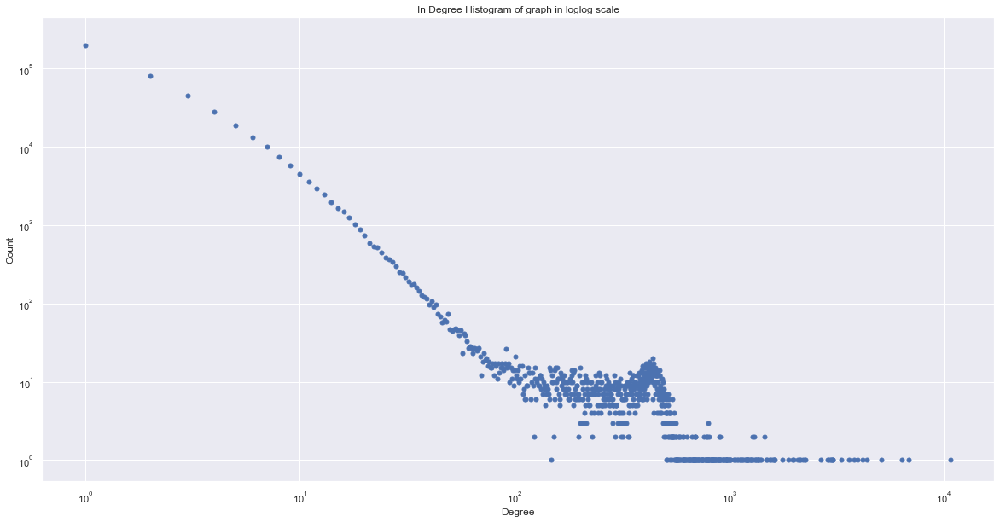

In [6]:
plot_in_degree_dist(G)

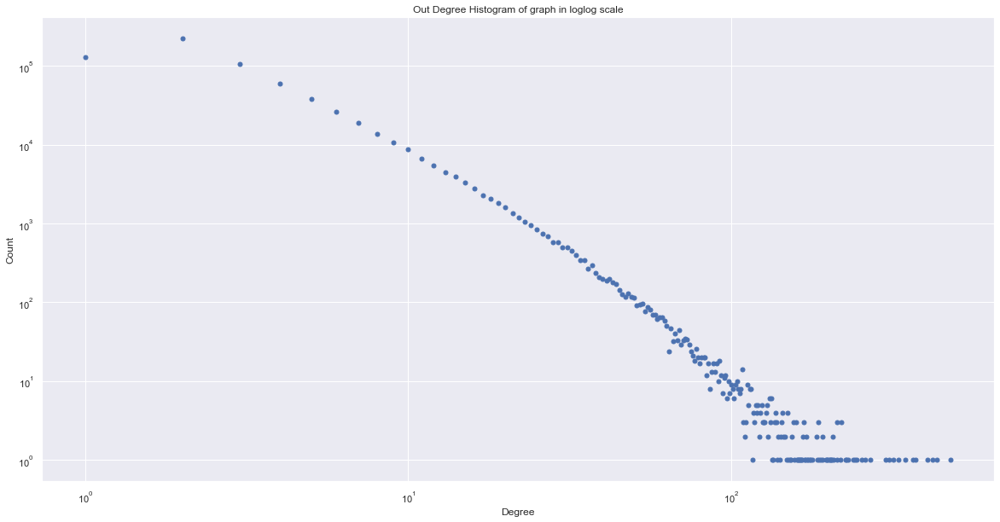

In [7]:
plot_out_degree_dist(G)

The out-degree follows a power-law distribution. 

The in-degree distribution looks a little different. We see a spike around degree 500, this could be explained by the way we extracted the data. The group of people there are probably the people with one or two successful posts where each "first comments" created a link to that person. The last group of people with in degree above 1000 are probably the individuals that have both successful posts and/or are actively commenting on other people’s posts and comments. This part follows more a "winner takes all" distribution

### Density

The density of a graph is the relationship between the number of nodes and the number of edges in the graph. For a complete graph the density is one. [\[2\]](#reference-2)

In [33]:
nx.density(G)

6.278033587957273e-06

The density of the graph is extreamly low due to the high number of nodes compared to the low number of edges. This is due to the tree-like structure of our network 

### Graph distance 


We are looking at the maximum distance between two nodes in the graph (Diameter) 

By running the following command "nx.diameter(G)", we get a infinity error. This makes sense as the directed version of the graph is not strongly connected as there are users where there are no connection between. 

We therefore tried to find the diameter for the undirected version of the graph: 

In [44]:
Un_G = G.copy()

In [45]:
Un_G = Un_G.to_undirected()

As there are users that are still only connencted to each other in smaller groups is the diameter of the grapth still infinity. 

We therfore investigate the biggest connected component:

In [59]:
Gc = max(nx.connected_component_subgraphs(Un_G), key=len)

In [60]:
len(Gc)/len(Un_G)

0.9999941465784556

This giant connected component is almost the entire graph, so running the algorithms on the biggest connected component wouldn't change the fact that it is very costly.

### Weigh distribution

In [16]:
weight = nx.get_edge_attributes(G, 'weight')

In [17]:
weight_list = list(weight.values())

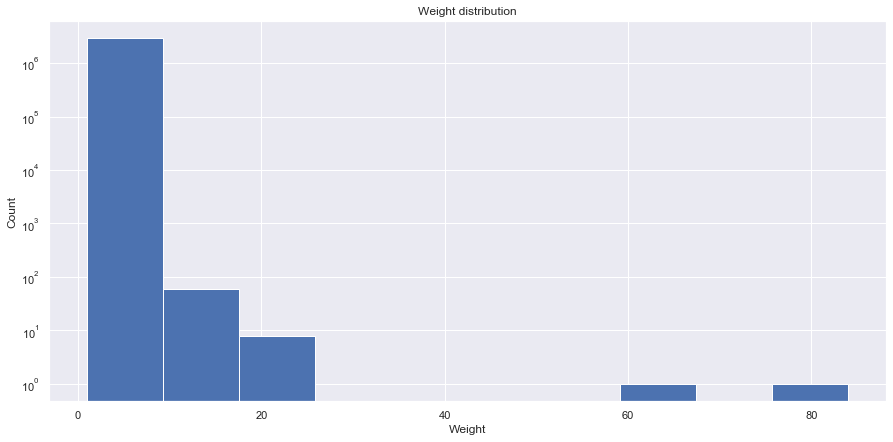

In [19]:
import collections
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set(style="darkgrid")

fig = plt.figure(figsize=(15,7))
plt.title("Weight distribution")
plt.xlabel("Weight")
plt.ylabel("Count")
plt.hist(weight_list)
ax = fig.axes
ax[0].set_yscale('log')
#ax[0].set_xscale('log')
    
plt.show()

From the plot it's pretty clear how the weight is distributed. It is clearly seen that almost every edge has the weight one, meaning that for most cases an interaction between to people are unique. 

### Eigenvector centrality 

We calculated the eigenvector centrality of all the users on DTU's HPC (due to the load on our personal computers). The eigenvector centrality of a node is a way to measure its influence in the network. Therefore this measure will be highest when a node is connected with other important nodes. The high-centrality neigbours node therefore have an impact on the centrality of the node in question.

In [21]:
import pickle
dbEigen = open('EigenCentrality.pickle', 'rb')      
eigen = pickle.load(dbEigen) 

The distribution of the eigenvector centrality is shown below. 

Notice however that the most central user called `djiboutiiii` is removed as he has a much higher centrality compared to the rest of the users.   

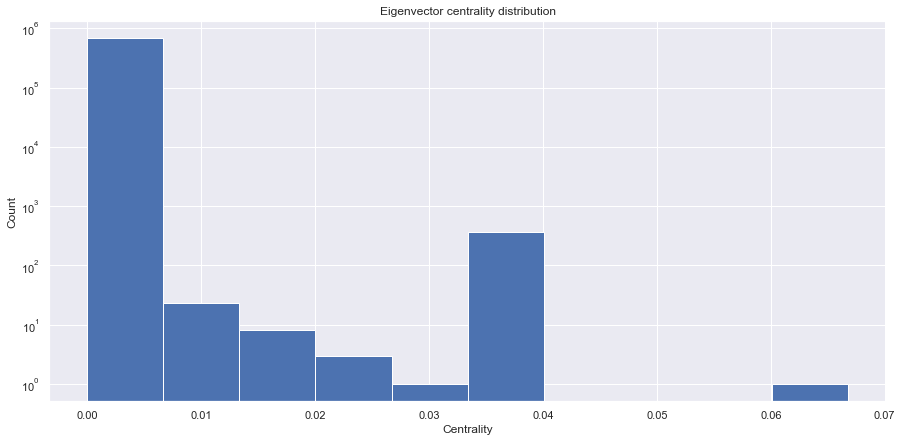

In [22]:
import collections
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set(style="darkgrid")

eigen_list = list(eigen.values())

eigen_list.remove(max(eigen_list))

fig = plt.figure(figsize=(15,7))
plt.title("Eigenvector centrality distribution")
plt.xlabel("Centrality")
plt.ylabel("Count")
plt.hist(eigen_list)
ax = fig.axes
ax[0].set_yscale('log')
#ax[0].set_xscale('log')
    
plt.show()

The most central users can be seen in the below list:

In [6]:
sortedEigenList = []
for key, value in eigen.items():
    temp = [key, value]
    sortedEigenList.append(temp)

In [7]:
sortedEigen = sorted(sortedEigenList, key=lambda kv: kv[1]['centrality'], reverse=True)

In [8]:
sortedEigen

[['djiboutiiii', {'score': 9725, 'centrality': 0.6941523796164677}],
 ['wykrhm', {'score': 25840, 'centrality': 0.0667866519086416}],
 ['jorsixo', {'score': 916, 'centrality': 0.03884783951602737}],
 ['McCree_From_Gamecube', {'score': 77, 'centrality': 0.03864622936315837}],
 ['hackfleischmann', {'score': 6, 'centrality': 0.03851141774770853}],
 ['FractalFactorial', {'score': 510, 'centrality': 0.03850133508021562}],
 ['Makkaroni_100', {'score': 62, 'centrality': 0.038500853194905246}],
 ['Zankman', {'score': 349, 'centrality': 0.037888956293855115}],
 ['SirHolyCow', {'score': 79, 'centrality': 0.03773312393837092}],
 ['Jacob_961', {'score': 7, 'centrality': 0.037733114032916}],
 ['kaukamieli', {'score': 513, 'centrality': 0.03748032968041529}],
 ['gamesrgreat', {'score': 309, 'centrality': 0.03716733974320043}],
 ['gzzlgzlk', {'score': 107, 'centrality': 0.03711908808806117}],
 ['Sleelan', {'score': 1555, 'centrality': 0.03705202799116582}],
 ['ThatForearmIsMineNow', {'score': 234, 'c

The top 5 users are all from `DotA2` subreddit. Apparently users of this subreddit are very central, which increases the centrality as everyone is connected together within that subreddit.

# 3. Tools, theory and analysis. 

### Eigenvector centrality vs Score
We wanted to investigate if there were a correlation betweeen central users and that users score.  

In [ ]:
#Create a directory with the centrality and the score for every user in the graph 
Author_dic = {}
q = 0
tot = len(list(comment.items()))
for comments in list(comment.items()):
    #if comments[1][0] in list(eigen.keys()):
    if q % 10000 == 0:
        print( int(q/tot*100))
    if comments[1][0] not in Author_dic.keys():
        Author_dic[comments[1][0]] = {'score': 0, 'centrality': eigen.get(comments[1][0], -1)}
        
    Author_dic[comments[1][0]]['score'] += int(comments[1][1])
    q+=1


In [ ]:
#We clean up the directory 
q = 0
tot = len(post_content)
for posts in list(post_content.items()):
    #if comments[1][0] in list(eigen.keys()):
    if q % 100 == 0:
        print( int(q/tot*100))
    if posts[1][0] not in Author_dic.keys():
        Author_dic[posts[1][0]] = {'score': 0, 'centrality': eigen.get(posts[1][0], -1)}
    
    Author_dic[posts[1][0]]['score'] += int(posts[1][2])
    q+=1


In [ ]:
author_info = {}
for author, info in Author_dic.items():
    if info['centrality'] != -1:
        author_info[author] = info

In [11]:
#Convert the directory into two list for plotting 
scores = []
central= []
for score in list(eigen.keys()):
    #Note that the one guy with much higher centrality than the rest is excluded from the list.
    if eigen[score]['centrality'] <=0.5:
        scores.append(int(eigen[score]['score']))
        central.append(eigen[score]['centrality'])

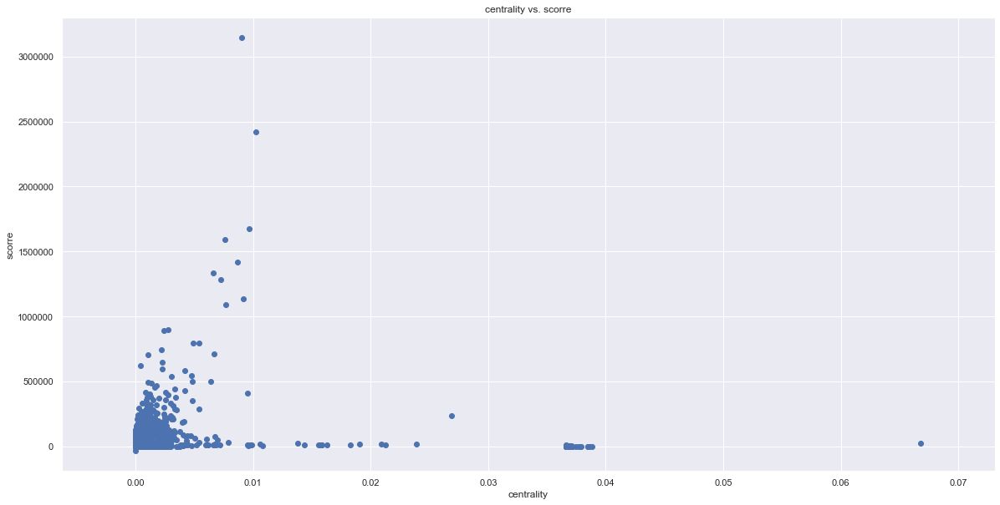

In [12]:
#PLOT scorre vs. centrality
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="darkgrid")

fig = plt.figure(figsize=(20,10))
plt.scatter(central, scores)
plt.title("Centrality vs. Score")
plt.ylabel("Score")
plt.xlabel("Centrality")


#ax = fig.axes
#ax[0].set_yscale('log')

plt.show()


It's possible to see a weak tendency between the centrality and the score of the users. We that the users with the hisgest score has an centrality around 0.005-0.01. No users with a centrality reallt close to zero have higher scores. There are a number of users that have higher centrality but very low scores. We investigated the reason for this phenomenon. The top 5 most central users: 

`'djiboutiiii'`,
`'wykrhm'`,
`'jorsixo'`,
`'McCree_From_Gamecube'`,
`'hackfleischmann'`

They are all connected to the subreddit DotA2, where the 3 most central are "moderators". Due to the way the eigenvector centrality algorithm works, the centrality of a node is determined based on your neigbours centrality. As moderator you will be commeting on alot of other users comments and a lot of people will hold you as being a point of reference to talk to in the subreddit, therefore what was found by the eigenvector centrality seems to reflect the reality of the community.

The DotA2 subreddit will be investigated further in the network section. 

## Community detection

### Link clustering

The community detection process is quite arduos in such a big network. We use an algorithm capable of capturing the overlapping and hierarchical nature of the communities on Reddit. Therefore we use the Link Community algorithm [\[1\]](#reference-1). The main idea is that now we look at link instead of nodes. A similarity between edges $e_{ik}$ and $e_{jk}$ which share a node $k$ is defined as the Jaccard index of the neighbours of the nodes $i$ and $j$, $n_+(i)$ and $n_+(j)$:

$$
S(e_{ik}, e_{jk}) = \cfrac{|n_+(i) \cap n_+(j)|}{|n_+(i) \cup n_+(j)|}
$$

This similarity will be the ratio between the nodes that are shared and all the nodes in the neighborhood of nodes $i$ and $j$. Note that $k$ is always shared between them. This measure will be 1 when the nodes in the neighborhood of one node are also in the neighborhood of the other node and instead will be small when some neighbors are not shared.

Then single-linkage hierarchical clustering is performed to create communities. A dendogram is built and then can be cut at different thresholds. To measure the quality of the communities at a given threshold, the partition density of each community is used. This different measure is used because it does not suffr from a resolution limit.

Quoting the paper directly for reference:
> For a network with $M$ links and $N$ nodes, $P = \{P_1, \cdots, P_C \}$ is a partition of the links into $C$ subsets. The numer of links in subset $P_c$ is $m_c = |P_c|$. The number of induced nodes, all nodes that those links touch, is $n_c = |\cup_{e_ij\in P_c} \{i,j\}|$.

> The link density $D_c$ of community $c$ is

$$
D_c = \cfrac{m_c - (n_c-1)}{n_c(n_c-1)/2 - (n_c - 1)}
$$

The partition density of the network is then the average of the partition densities weighted by the fraction of link present in the community.

What is interesting is the interpretation of such measure. The partition density will be biggest when the cluster has the maximum numbr of link possible, while it will be 0 when it's a tree. Note that this measure can also be negative if the community if formed by more than 1 connected component.

To process such a big network we use the C++ implementation of the algorithm by In order to identify the link communities we use the algorithm written by 
Jim Bagrow, Yong-Yeol Ahn adn Jean-Gabriel Young https://github.com/bagrow/linkcomm.

We prepared all the input necessary to process the data using the graph `G2`. 

### Partition Density
We now look at the results for the partition density at different thresholds.

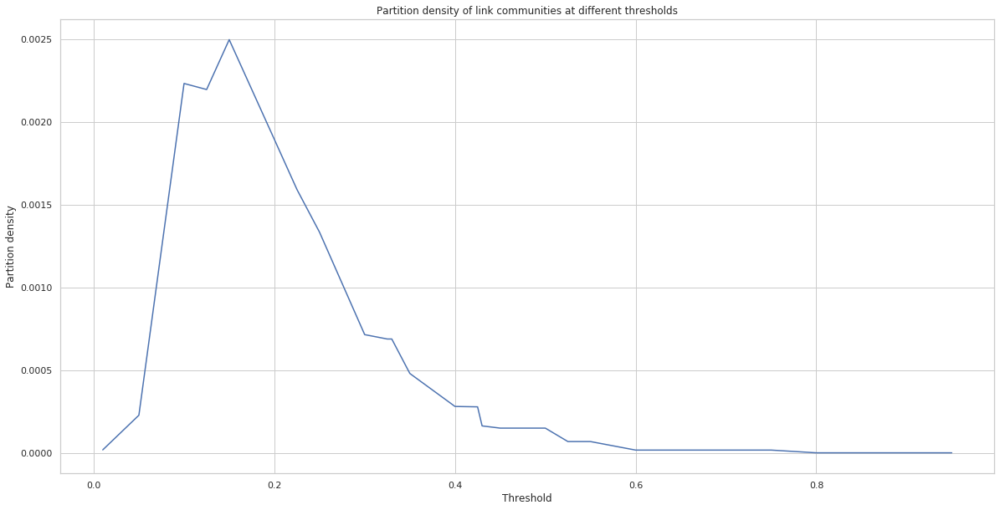

In [49]:
sns.set(style="whitegrid")

plt.figure(figsize = (20,10))
plt.title("Partition density of link communities at different thresholds")
plt.plot(list(partition_density.keys()), list(partition_density.values()))
plt.xlabel("Threshold")
plt.ylabel("Partition density")
plt.show()

By looking at this graph of the partition density against the threshold we decide to pick the threshold with highest partition density.

It is important to note that from these results we can already tell that the communities will mostly resemble a tree strcture, which is expected because of the nature of the network, formed by people answering someone's comment or post. This is not only because of how Reddit works, but also because of how we sampled our data. For such a huge network such as Reddit, getting unbiased results is very difficult.


Threshold:

$$
T = 0.15
$$

### Getting the link communities

We parse the results obtained from running the algorithm.

In [51]:
# process the conversion from integers back to nodes
f = open("reddit_edges_100.int2node", "r")
int2node = []
line = f.readline()
while line:
    number, node = line[:-1].split("\t")
    int2node.append(node)
    line = f.readline()
f.close()

# minimum number of nodes to have a non-trivial community
min_nodes = 3
# threshold at which the dendogram was cut
threshold = "0.15"
f = open("clusters/network_{}.cluster".format(threshold), "r")
line = f.readline()
#the communities
communities = []
community = {}
community_id = 0
# go through each line of the file
while line:
    # get all the edge pairs
    edge_pairs = line[:-2].split(" ")
    list_edges = []
    for edge_pair in edge_pairs:
        # get edge in tuple form
        edge_pair_split = edge_pair.split(",")
        edge = (int2node[int(edge_pair_split[0])], int2node[int(edge_pair_split[1])])
        # add it to the list of edges
        list_edges.append(edge)
        
    # remove trivial communities
    if len(nodes_in_edgelist(list_edges)) >= min_nodes:
        for edge in list_edges:
            # map from edge to its community
            community[edge] = community_id
        community_id += 1
        # list of all the communities with the edges inside them
        communities.append(list_edges)
        
    # go to next line
    line = f.readline()
f.close()

### Analysis of the results

#### Distribution of number of users in communities

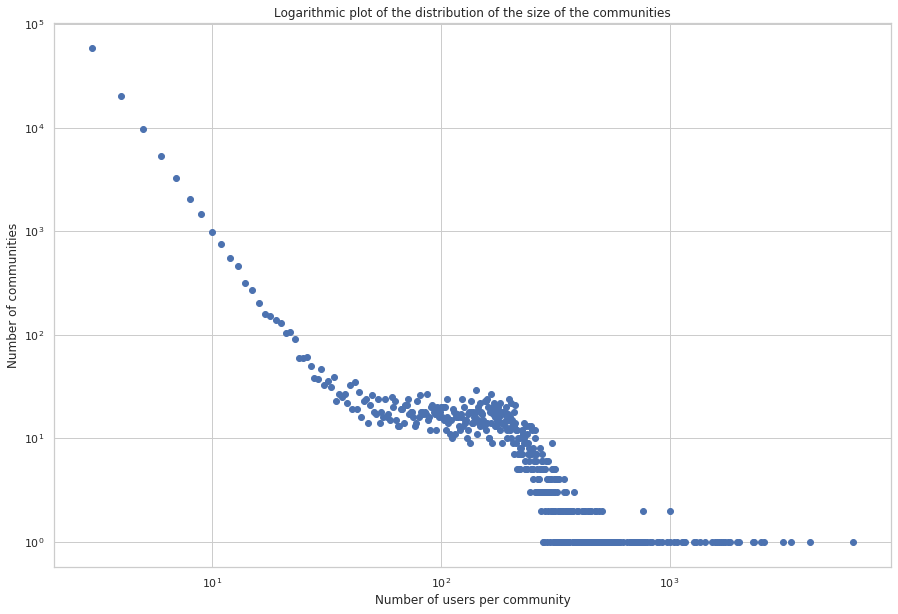

In [379]:
community_users = [nodes_in_edgelist(c) for c in communities]

size_communities = [len(c) for c in community_users]
max_size = math.ceil(max(size_communities))
min_size = math.floor(min(size_communities))

bins = list(range(min_size, max_size+2))

dist_hist, dist_bins = np.histogram(size_communities, bins=bins)

plt.figure(figsize=(15, 10))
plt.loglog(dist_bins[:-1], dist_hist, "o")
plt.title("Logarithmic plot of the distribution of the size of the communities")
plt.xlabel("Number of users per community")
plt.ylabel("Number of communities")
plt.show()

This graph is very similar to the distribution of the  indegree of our network. In that graph we could see that as the in-degree went up, the number of nodes with that in-degree went down, until it reached around 100, where there was a spike.

This was partly caused by the way we sampled the data: when a query to get the depth-0 comments is made to the server, there is a maximum amount of these that are retrieved. Furthermore, posts that are successfull tend to have around 50 to 500 depth-0 comments. 

Users who posted instead of just commenting, and therefore had their degree determined by the amount of people responding to their posts will skew the distribution. We think something similar is happening here. The people who post unexpectedly increase the number of communities having 50 to 500 users.

#### Distribution of number of subreddits in communities

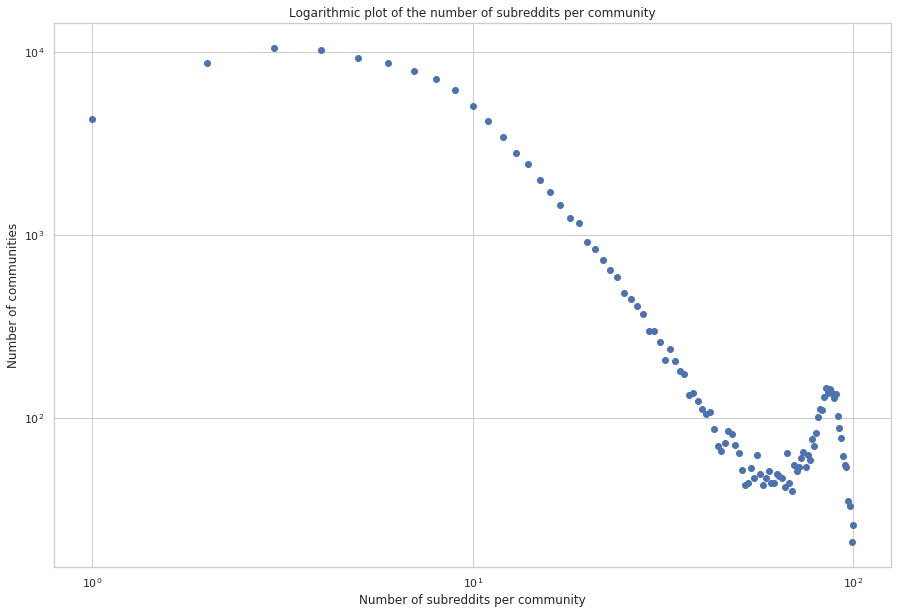

In [56]:
num_subreddits = [len(c) for c in subreddits_in_communities]
max_size = math.ceil(max(num_subreddits))
min_size = math.floor(min(num_subreddits))

bins = list(range(min_size, max_size+2))

dist_hist, dist_bins = np.histogram(num_subreddits, bins=bins)

plt.figure(figsize=(15, 10))
plt.loglog(dist_bins[:-1], dist_hist, "o")
plt.title("Logarithmic plot of the distribution of the number of subreddits per community")
plt.xlabel("Number of subreddits per community")
plt.ylabel("Number of communities")
plt.show()

This graph provides another insight into how the communities are formed. We see that most of the communities are made of users who post in less than 20 subreddits altoghether. Then the number of communities than span almost all the subreddit suddenly spikes up. This shows that the algorithm was capable of detecting quite a lot of communities that span aalmost all the subreddits. We think these are caused by those users that post in a lot of different subreddits and therefore are easily asnwered to by users that span the entire 100 subreddit dataset.

#### Distribution of number of communities per user

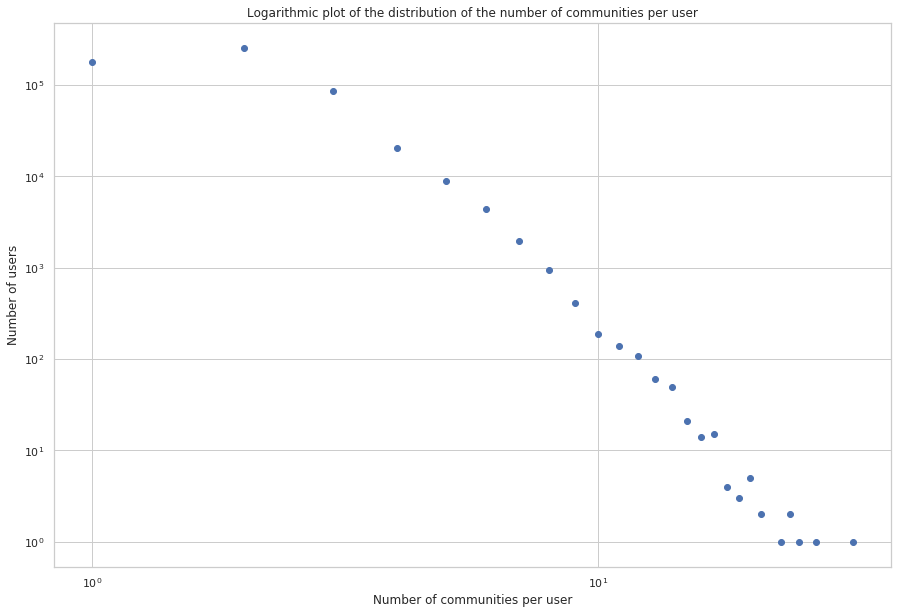

In [378]:
max_size = math.ceil(max(lista))
min_size = math.floor(min(lista))

bins = list(range(min_size, max_size+2))

dist_hist, dist_bins = np.histogram(lista, bins=bins)

plt.figure(figsize=(15, 10))
plt.loglog(dist_bins[:-1], dist_hist, "o")
plt.title("Logarithmic plot of the distribution of the number of communities per user")
plt.xlabel("Number of communities per user")
plt.ylabel("Number of users")
plt.show()

This plot shows the distribution of the number of communities per user, we can see that it follows approximately a power law. Most users partecipate in very few communities and as the number of communities goes up this value goes down. At the end we can see one user that partecipates in 32 different communities.

This is an expected behaviour of the users and would also corroborate our intuition that most users only ever interact in a few distinct communities on reddit, and that the users who receive the most upvotes (which are represented better in our dataset), are not partecipating in a single community but more than one.

#### One of the communities

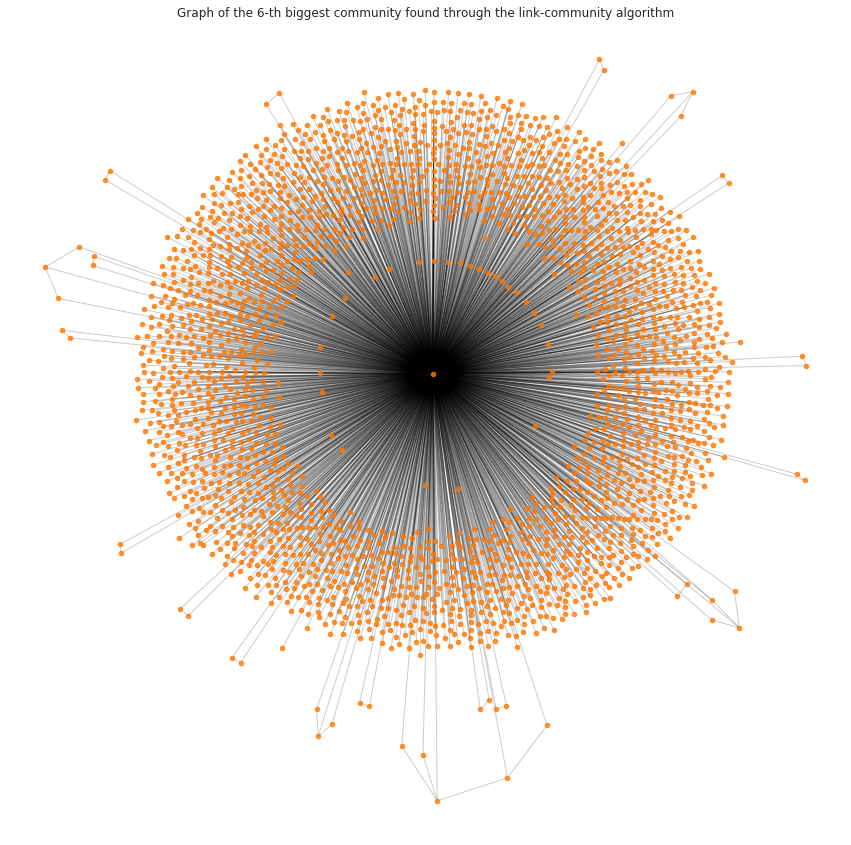

In [59]:
plt.figure(figsize = (15,15))
plt.title("Graph of the 6-th biggest community found through the link-community algorithm")
nx.draw_networkx_nodes(subG2, positions, node_size=20, with_labels=False, node_color="#FF7702", alpha=0.8)
nx.draw_networkx_edges(subG2, positions, edge_color="black", alpha=0.2)
plt.axis('off')
plt.show()

From this graph we can appreciate the "tree-like" nature of the community. It's mainly one single user at the center sorrounded by other users that have interacted with him.

We chose the 6-th biggest because otherwise the graph would have been unreadable.

## Qualitative analysis of the communities

To get a better understanding of how well the communities have been selected and if there is any interesting pattern within the subreddits we decided to focus only on a subset of subreddits that we deemed interesting. 

This selection was based on plotting the graph of the subreddit with its communities after keeping only those that had a number of users above a threshold and also a confusion matrix using an image.

We don't run the link community algorithm again on the smaller subgraphs extracted, we interested to see if there are subreddits that don't share communities. We noticed that when communities span multiple subreddits they are usually much smaller than when they are contained within one single subreddit. This is why we look to see if two communities don't share, as this is more rare than when they share something.

### The subreddits

A user belongs to a subreddit if he has interacted in it. Therefore the coloring of the users will depend on the last nodes that are colored in. This choice is made because when comparing two subreddits we are well aware of their structure and all other analysis we have done does not suffer from this bias.

The `formula1` subreddit is an example of subreddits that shows clear inner communities. The graph on the bottom shows, in color, communities found by the link community algorithm with at least 50 users in them. This arbitrary threshold has been put to better visualize the most important communities within the subreddit.

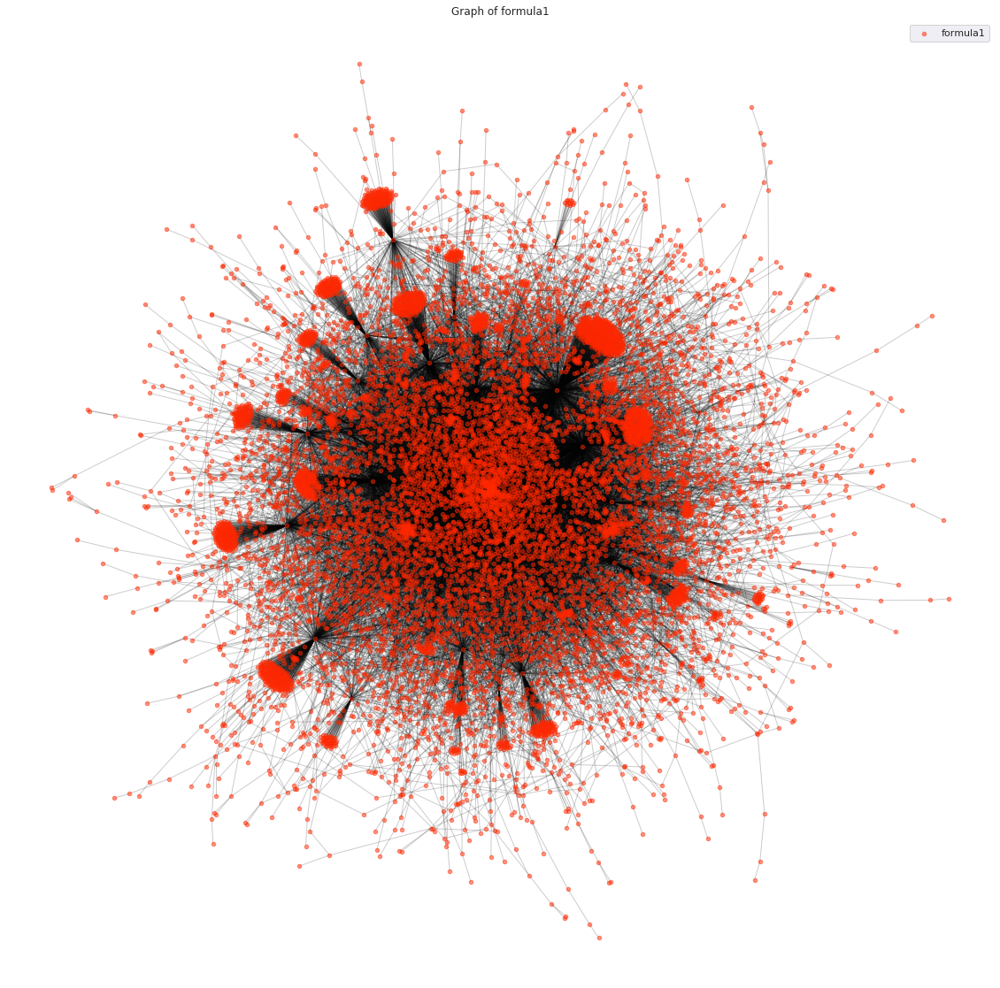

In [42]:
plt.figure(figsize = (20,20))

plt.title("Graph of {}".format(", ".join(map(str,display_subreddits) )))
for subreddit in display_subreddits:
    nx.draw_networkx_nodes(G2_s, positions, nodelist=users_of_selected_subreddits[subreddit], node_size=20, with_labels=False, node_color=color_map[subreddit], alpha=0.5, label = subreddit)
nx.draw_networkx_edges(G2_s, positions, edge_color="#000000", alpha=0.2)
plt.legend()
plt.axis('off')
plt.show()

Here the communities in `formula1`. We can see examples of users belonging to different communities, thus displaying the overlap we were looking to achieve with the link communities.

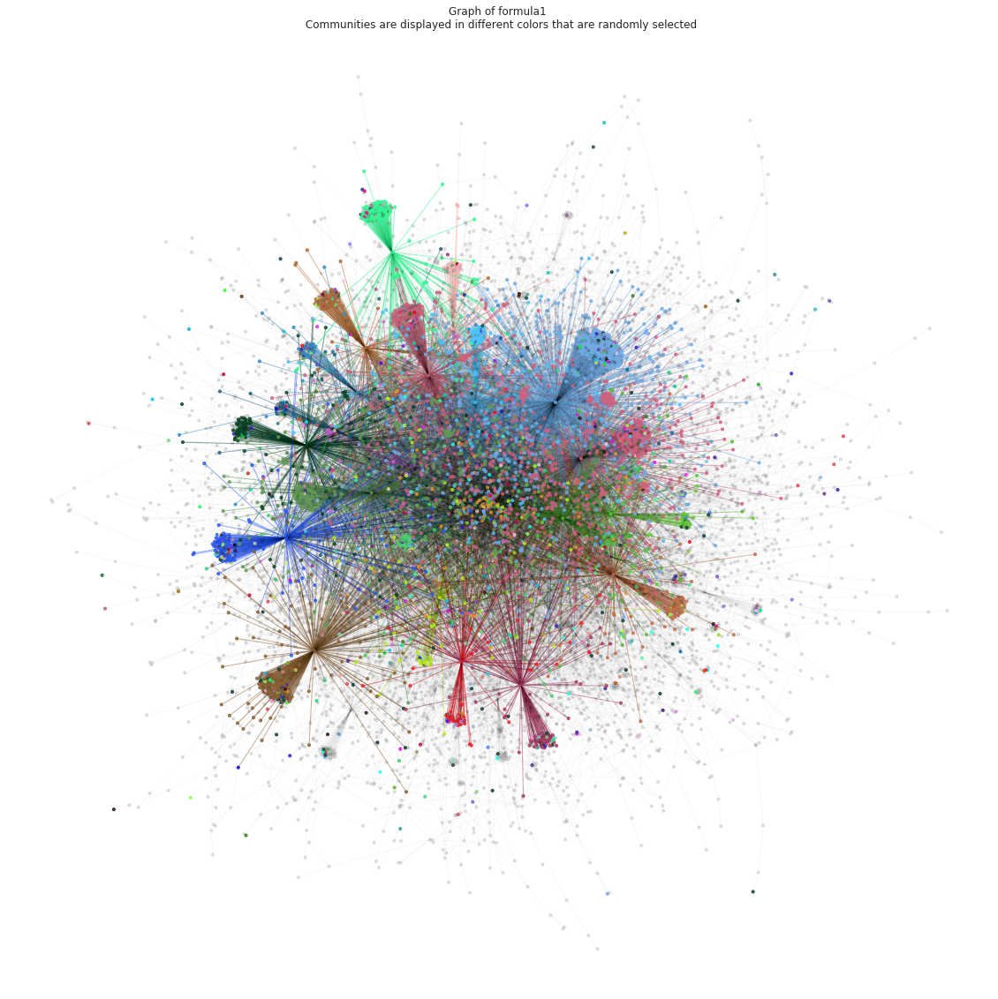

In [46]:
 plt.figure(figsize = (20,20))

plt.title("Graph of {} \n Communities are displayed in different colors that are randomly selected".format(", ".join(map(str,display_subreddits) )))

nx.draw_networkx_nodes(G2_s, positions, node_size=10, with_labels=False, node_color=node_colors, alpha=node_opacities)
nx.draw_networkx_edges(G2_s, positions, edgelist = colored_edges,  edge_color=edge_colors, alpha= 0.5)
nx.draw_networkx_edges(G2_s, positions, edgelist = transparent_edges,  edge_color="#000000", alpha= 0.03)

plt.axis('off')
plt.show()

Follows an examples of two subreddits that don't share many communities: `formula1` and `anime`. They are very much disconnected.

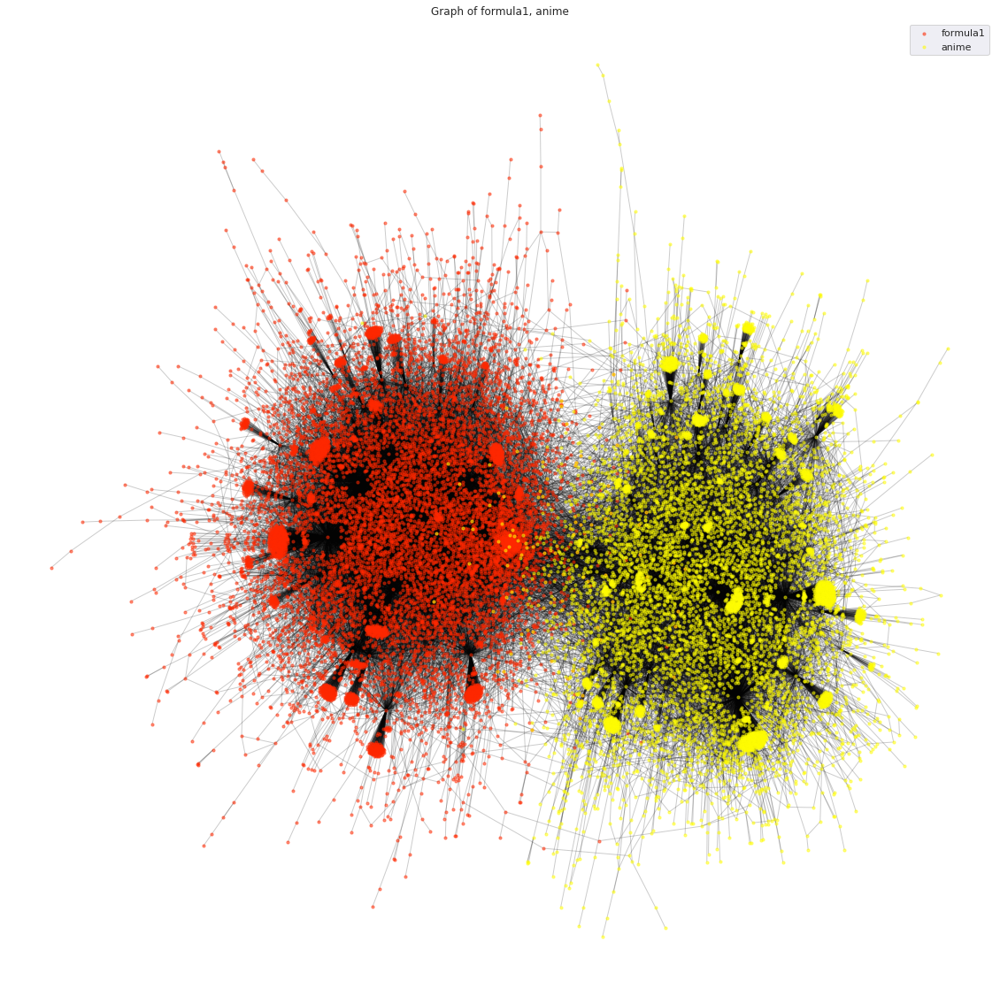

In [81]:
plt.figure(figsize = (20,20))

plt.title("Graph of {}".format(", ".join(map(str,display_subreddits) )))
for subreddit in display_subreddits:
    nx.draw_networkx_nodes(G2_s, positions, nodelist=users_of_selected_subreddits[subreddit], node_size=10, with_labels=False, node_color=color_map[subreddit], alpha=0.5, label = subreddit)
nx.draw_networkx_edges(G2_s, positions, edge_color="#000000", alpha=0.2)
plt.legend()
plt.axis('off')
plt.show()

Here the display of `formula1` and `anime` communities. We can see at least 3 communities that appear to be shared between the two subreddits, but overall there is no cross-over.

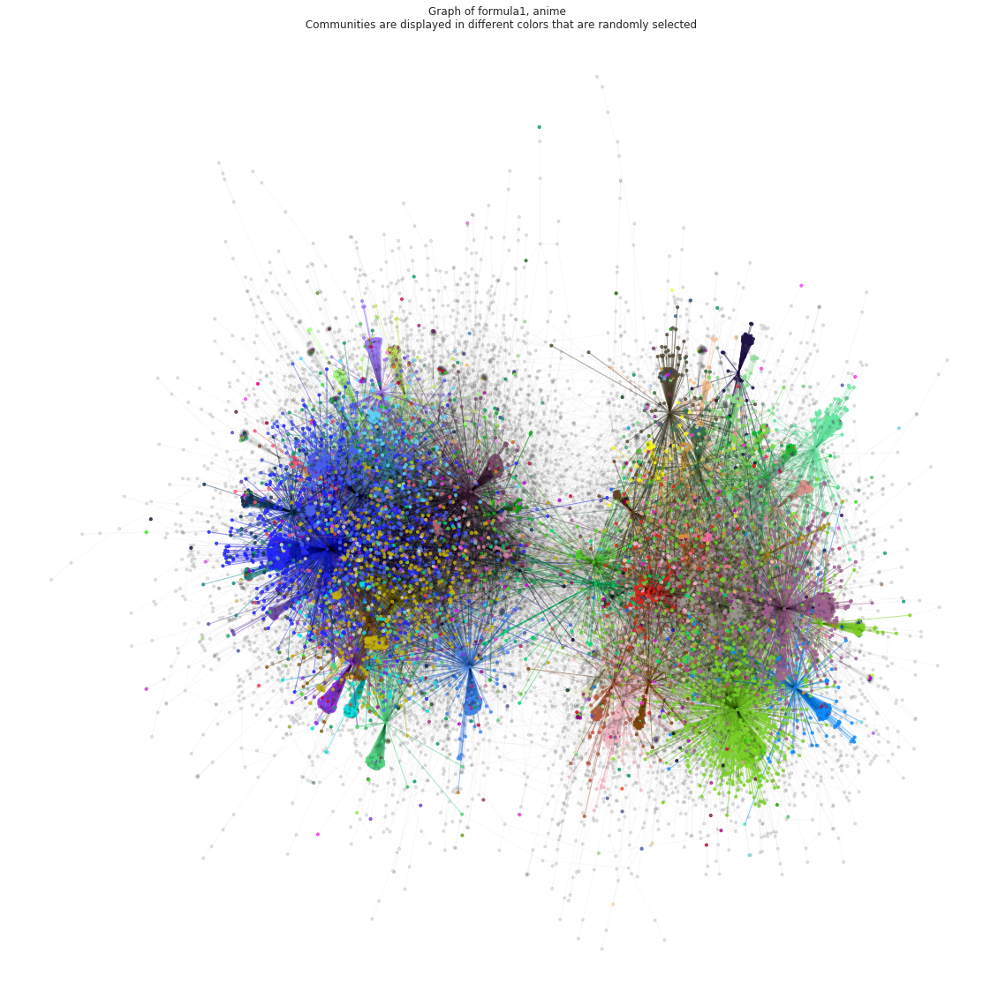

In [71]:
 plt.figure(figsize = (20,20))

plt.title("Graph of {} \n Communities are displayed in different colors that are randomly selected".format(", ".join(map(str,display_subreddits) )))

nx.draw_networkx_nodes(G2_s, positions, node_size=10, with_labels=False, node_color=node_colors, alpha=node_opacities)
nx.draw_networkx_edges(G2_s, positions, edgelist = colored_edges,  edge_color=edge_colors, alpha= 0.5)
nx.draw_networkx_edges(G2_s, positions, edgelist = transparent_edges,  edge_color="#000000", alpha= 0.03)

plt.axis('off')
plt.show()

Follows the graph of subreddit `DotA2` where we can see the user with highest eigenvector centrality.

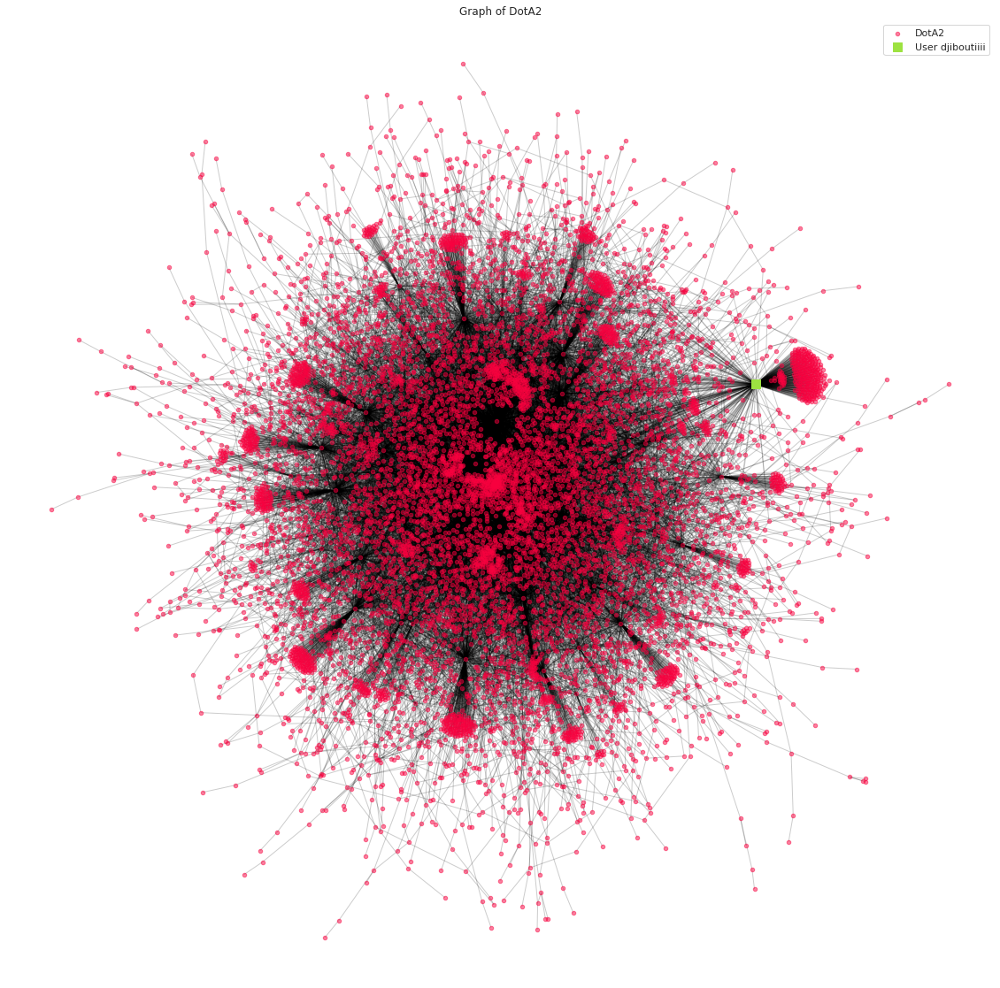

In [334]:
plt.figure(figsize = (20,20))

plt.title("Graph of {}".format(", ".join(map(str,display_subreddits) )))
for subreddit in display_subreddits:
    nx.draw_networkx_nodes(G2_s, positions, nodelist=users_of_selected_subreddits[subreddit], node_size=20, with_labels=False, node_color=color_map[subreddit], alpha=0.5, label = subreddit)

nx.draw_networkx_nodes(G2_s, positions, nodelist=["djiboutiiii"], node_size=100, with_labels=False, node_color="#9DE241", alpha=1, node_shape="s", label = "User djiboutiiii")
    
nx.draw_networkx_edges(G2_s, positions, edge_color="#000000", alpha=0.2)
plt.legend()
plt.axis('off')
plt.show()

Follows and example of two subreddits that are very much interlinked together: `science` and `askscience`. Here some of the users are shared, but the effect is mostly due to the high amount of interconnections between users and the fact that `askscience` has less users than `science`.

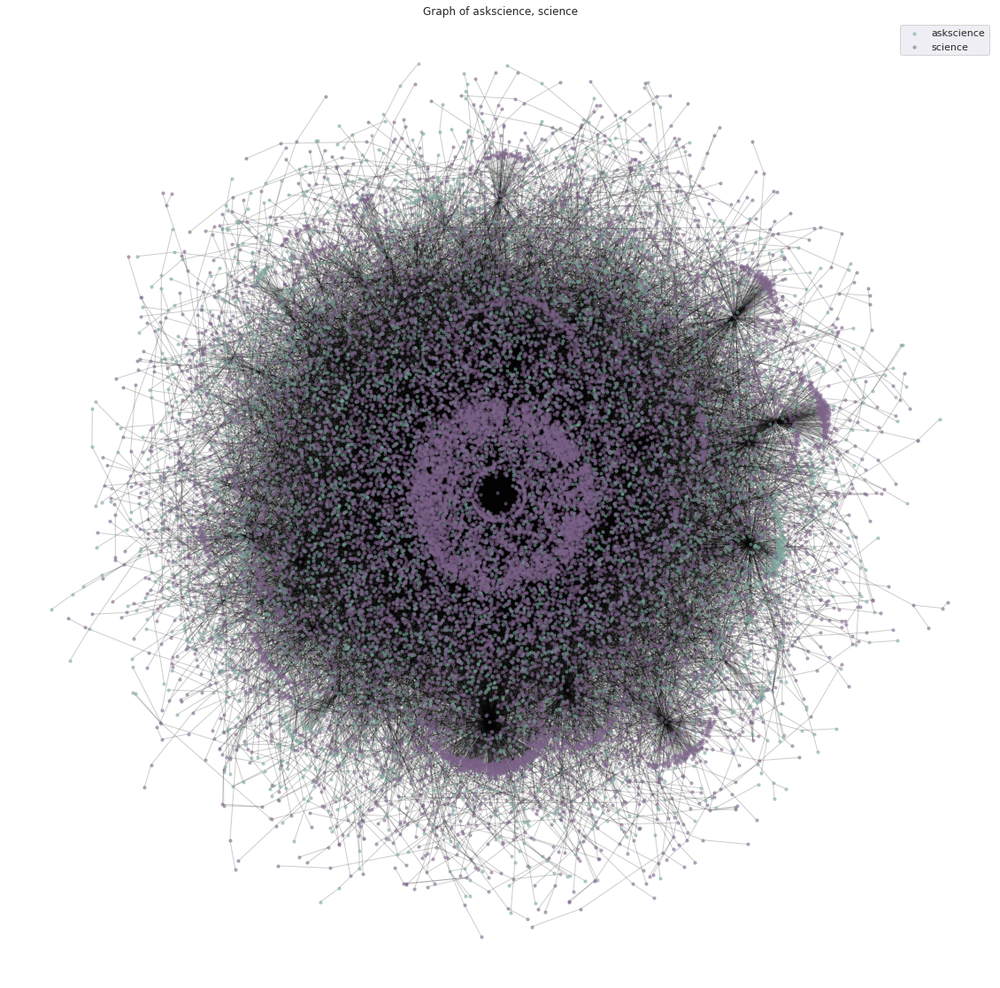

In [112]:
plt.figure(figsize = (20,20))

plt.title("Graph of {}".format(", ".join(map(str,display_subreddits) )))
for subreddit in display_subreddits:
    nx.draw_networkx_nodes(G2_s, positions, nodelist=users_of_selected_subreddits[subreddit], node_size=10, with_labels=False, node_color=color_map[subreddit], alpha=0.5, label = subreddit)
nx.draw_networkx_edges(G2_s, positions, edge_color="#000000", alpha=0.2)
plt.legend()
plt.axis('off')
plt.show()

Looking at the communities in the graph does not help in understand the behaviour of the communities, but the confusion matrix is much more straightforward.

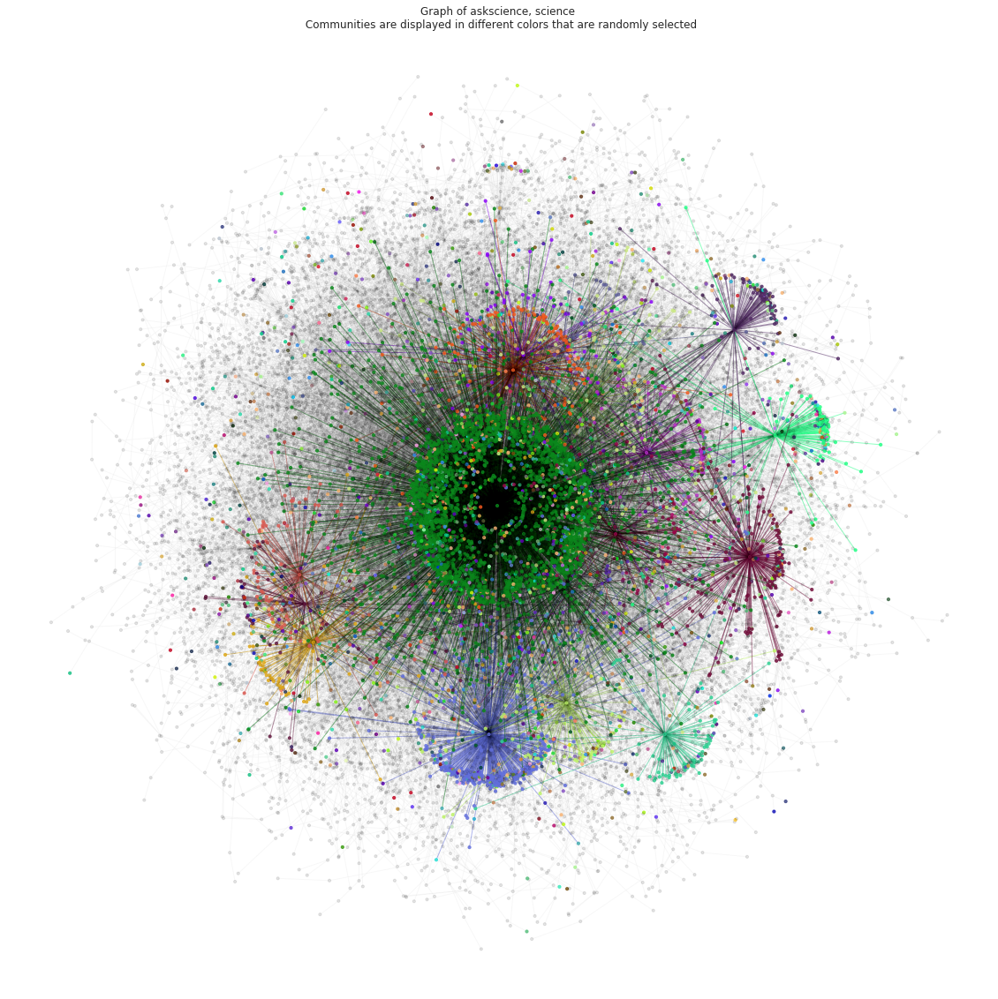

In [106]:
 plt.figure(figsize = (20,20))

plt.title("Graph of {} \n Communities are displayed in different colors that are randomly selected".format(", ".join(map(str,display_subreddits) )))

nx.draw_networkx_nodes(G2_s, positions, node_size=10, with_labels=False, node_color=node_colors, alpha=node_opacities)
nx.draw_networkx_edges(G2_s, positions, edgelist = colored_edges,  edge_color=edge_colors, alpha= 0.5)
nx.draw_networkx_edges(G2_s, positions, edgelist = transparent_edges,  edge_color="#000000", alpha= 0.03)

plt.axis('off')
plt.show()

In [ ]:
# filter communities for visualization.
def threshold_communities(communities, threshold):
    #community->users dictionary
    thresh_communities = {}
    
    for community, users in communities.items():
        if len(users)>threshold:
            thresh_communities[community] = users
    return thresh_communities

In [ ]:
def confusion_matrix(user_comms, user_baseline_comms):
    # user->list of communities in both arguments
    
    # get the set of baseline communities
    baseline_comms = set()
    for user, cur_comms in user_baseline_comms.items():
        baseline_comms = baseline_comms.union(set(cur_comms))
    # get the set of communities
    comms = set()
    for user, cur_comms in user_comms.items():
        comms = comms.union(set(cur_comms))
    
    confusion_matrix = {}
    for baseline_comm in baseline_comms:
        confusion_matrix[baseline_comm] = {}
        for comm in comms:
            confusion_matrix[baseline_comm][comm] = 0

    k = 0
    tot = len(user_baseline_comms.items())
    # faster algorithm: go through every user in the baseline communities, check if it's also in the the 
    # disctionary of communities, if it is, add to the matrix for all the subreddits and communities
    # where this user belongs
    for user, cur_baseline_comms in user_baseline_comms.items():
        # check progress
        if k%(int(tot/10)) == 0:
            print(k/tot*100, "%")
        k += 1 
        if user in user_comms.keys():
            communities_of_user = user_comms[user]
            if len(communities_of_user) < 3: # <3
                continue
            for cur_baseline_comm in cur_baseline_comms:
                for cur_comm in communities_of_user:
                    confusion_matrix[cur_baseline_comm][cur_comm] += 1
        
    return confusion_matrix
   
# function to create the image, here we can do a further thresholding and a relative one based on
# the ratio between users in the community in the subreddit and the total number of users in the subreddit
# the output image is also normalized according to that
def confusion_matrix_to_image(conf_matrix, threshold = -1, relative_threshold = 0.01):
    # get the number of baseline communities
    number_of_baseline_comms = len(conf_matrix.keys())
    # get list of communities as reference, sothat we make sure the order is the same
    list_of_comms = list(conf_matrix.values())[0].keys()
    number_of_comms = len(list_of_comms)
    
    # initialize to 0 all the pixels
    confusion_image = np.zeros((number_of_baseline_comms,number_of_comms))

    # index of the community
    q = 0
    # used to get the id of the community
    comm_map = {}
    for baseline_comm, frequencies in conf_matrix.items():
        # prepare the output of this subreddit
        output_frequencies = []
        # get total number of communities members in the subreddit
        sum_frequencies = sum([x for _, x in frequencies.items()])
        # go through all the communities
        for comm in list_of_comms:
            # compute relative frequency
            freq = frequencies[comm]/sum_frequencies
            # apply thresholding
            freq = 0 if (freq*sum_frequencies < threshold) or (freq < relative_threshold) else freq
            output_frequencies.append(100*freq)
        # add frequencies normalized
        confusion_image[q,:] = np.array(output_frequencies).T
        comm_map[q] = baseline_comm
        q += 1
    # remove all columns with 0s in them
    return confusion_image[:,~np.all(confusion_image == 0., axis=0)], comm_map

In [142]:
conf_image, subreddit_comm_map = confusion_matrix_to_image(conf_matrix, -1, 0.04)

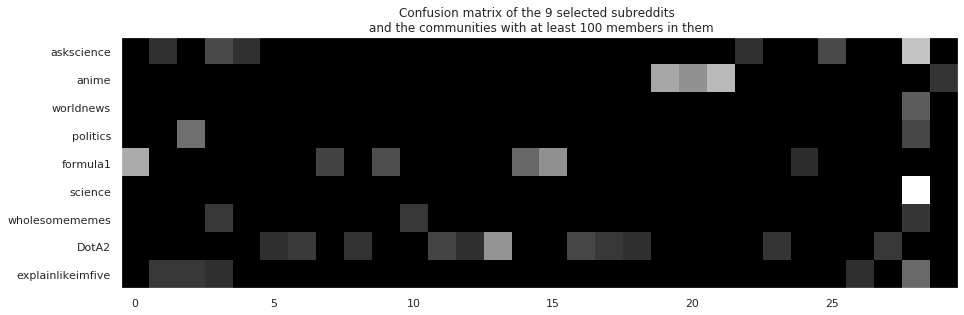

In [143]:
plt.figure(figsize = (15,15))
plt.title("Confusion matrix of the 9 selected subreddits \n and the communities with at least {} members in them".format(threshold))
plt.grid(False)
imgplot = plt.imshow(conf_image, cmap = "gray")
plt.yticks(range(0,len(subreddit_comm_map)), list(subreddit_comm_map.values()))
plt.show()

Each column of the image is a distinct community. Each row is a subreddit.

This image was obtained by selecting communities with at least $100$ members in them and then removing all the communities that had a population of less than $4\%$ of the total users in the subreddit. This allows to see a more clear and relevant summary of the information that would otherwise be very clouded.

The brighter the pixel at coordinate $ (x, \text{subreddit_name} )$ the more number of users of community $x$ are in subreddit $\text{subreddit_name}$.

#### Comment on the confusion matrix

We can see how `formula1` and `anime` don't have any community in common and seem to have no community in common with any other subredddit, this is an effect of the thresholding we have performed.

It's interesting to note that there is a big community spanning all the subreddits expect the smaller, more "niche" ones such as `anime`, `formula1` and `DotA2`.

`DotA2` is also characterized by a relatively high number of communities with more than 100 members compared to the other subreddits. This might be part of the explanation as to why users from `DotA2` are so central.

We hoped to see something interesting from `politics`, but it seems that it is a highly regulated subreddit, where not many interesting interactions happen (even when trying to compare with `worldnews` which should be a topically linked subreddit).


## Sentiment analysis 


In the following section we will show how we have worked with the individual comment text. We will explain how we analysed the individuel comment. First the centrality of a user will be compared with that users comment sentiment. 

We will then compare the sentiment for the post and subreddits with the score to see if there are a correlation between more popular post/subreddits and the sentiment, in other words is positive post more likely to become popular.


We start by calculating the sentiment of the individual comment by first tokenizing the text, removing stopwords, digits etc. We then used the LabMT wordlist as a reference for the sentiment by comparing the words in the comments with the words in the list. We also saved the emojies in the comments as these could have effect on the percived sentiment of a comment. 

In [2]:
import pickle
dbcomment = open('comment_content_100.pickle', 'rb')      
comment = pickle.load(dbcomment)

#Read LabMT wordlist
LabMT = pd.read_csv('labMT.txt', delim_whitespace=True, skiprows=3)
LabMT_dict = LabMT.to_dict()

# Convert LabMT to dictonary for faster search
sentiment_dict = {}
for index, row in LabMT.iterrows():
    sentiment_dict[row['word']] = row['happiness_average']

#Stemming
import nltk
porter = nltk.PorterStemmer()
stem_dic ={}
for word in sentiment_dict:
    stem_dic[porter.stem(word)] =  sentiment_dict[word]

Note that we have chosen to stem the comments along with the reference list. This desicion will be reflected on in the discussion.  

In [4]:
#Creating the method for calculating sentiment
def calc_sentiment(text):
    score = 0
    count = 0
    for word in text:
        if word in sentiment_dict.keys():
            score = score + sentiment_dict[word]
            count = count+1
    if score > 0 and count > 0:
        score = score/count
        return score
    return None

In [11]:
#Make tweets suitable for sentimental analysis
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
import emoji
stop_words = stopwords.words('english')

def SentimentComment(comment):
    from nltk.corpus import stopwords
    stop_words = stopwords.words('english')
    #Tokenize
    comment = comment.replace("comma","")
    tokenizedComment = word_tokenize(comment)  
    #Remove stopwords
    tokenizedComment = [word for word in tokenizedComment if word not in stop_words]
    #Remove empty tokens
    tokenizedComment = list(filter(None, tokenizedComment))
    #Select words only and converting to lower
    tokenizedComment = [word.lower() for word in tokenizedComment if word.isalpha()]
    tokenizedComment = [s for s in tokenizedComment if s and s!="{comma}" and len(s)>1]
    #Getting the emojies in a comment
    emojiListe = [c for c in comment if c in emoji.UNICODE_EMOJI]
    
    #Sentiment
    sentiment = calc_sentiment(tokenizedComment)
    
    return {'tokens': tokenizedComment, 'emojis': emojiListe, 'sentiment': sentiment}


In [ ]:
sentiment_dic = {}
q = 0
pop = len(comment)
for comments in list(comment.items()):
    if q % 10000 == 0:
        print( int(q/pop*100))
        
    sentiment_dic[comments[0]] = SentimentComment(list(comments)[1][4])
    
    q+=1

with open('sentimentComment.pickle', 'wb') as handle:
    pickle.dump(sentiment_dic, handle)

We now have a file containing the sentiment of the comment, the tokenized text and the emoji unicode. 

We will now use this information to analyse the users, post, subreddits and communities. 

## Centrality of a user vs. Sentiment of their comments

We want to investigate if users with a central position in the network are more popular. 

In [ ]:
import pickle
dbEigen = open('EigenCentrality', 'rb')      
eigen = pickle.load(dbEigen)

In [2]:
dbcomment = open('comment_content_100.pickle', 'rb')      
comment = pickle.load(dbcomment)

In [3]:
dbsentiment = open('sentimentComment.pickle', 'rb')      
sentiment = pickle.load(dbsentiment)

We have calculated the sentiment of each comment. By storing the average sentiment of each comment and the length of the comment we can then calculate the sentiment of each user, subreddit or community without having to perform sentiment analysis again.

We keep the length of the comment into account because this way, the number of words a user has written has influence on the "weight" of the sentiment. People who write multiple comments or very long comments therefore have more influence than people who write few comments. This way we avoid those people with only a few very extreme comments.

In [ ]:
q = 0
tot = len(comment)

Centrality_sentiment = {}
for com in list(comment.items()):
    if q % 10000 == 0:
            print( int(q/tot*100))
    #intiate dict with user as key        
    if com[1][0] not in Centrality_sentiment.keys() and com[1][0] in eigen.keys():
        Centrality_sentiment[com[1][0]] = {'centrality': float(eigen[com[1][0]]), 'sentiment_comment': 0 , 'length_comment': int(0)}
    
    if sentiment[com[0]]['sentiment'] != None and com[1][0] in eigen.keys():
        Centrality_sentiment[com[1][0]]['length_comment'] +=len(sentiment[com[0]]['tokens'])
        Centrality_sentiment[com[1][0]]['sentiment_comment'] += float(sentiment[com[0]]['sentiment']*len(sentiment[com[0]]['tokens']))
    q+=1   

In [18]:
for every in Centrality_sentiment.keys():
    if Centrality_sentiment[every]['length_comment'] != 0:
        Centrality_sentiment[every]['sentiment_comment'] = Centrality_sentiment[every]['sentiment_comment']/Centrality_sentiment[every]['length_comment']

In [20]:
#create list for plotting
centrality = []
sentimen= []
for sentiments in list(Centrality_sentiment.keys()):
    centrality.append(float(Centrality_sentiment[sentiments]['centrality']))
    sentimen.append(Centrality_sentiment[sentiments]['sentiment_comment'])

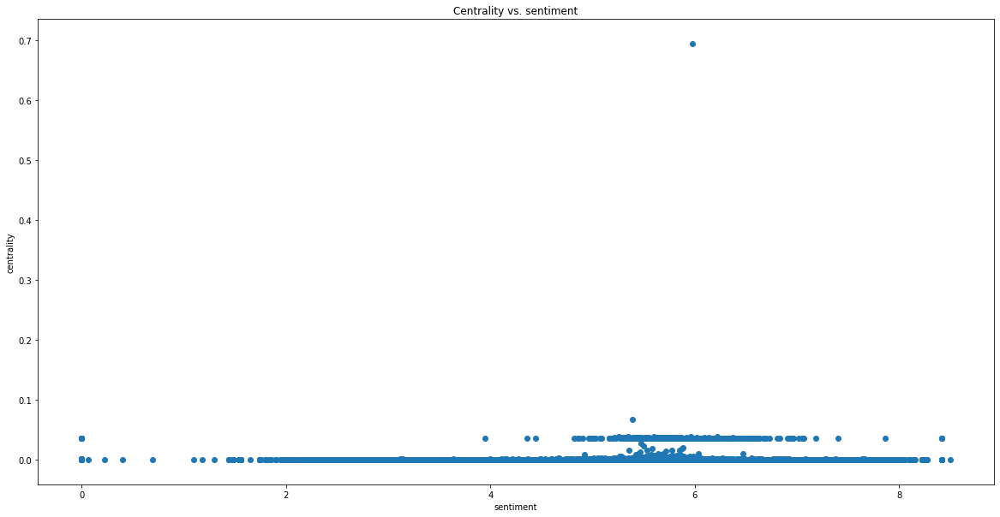

In [23]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,10))
plt.scatter(sentimen, centrality)
plt.title("Centrality vs. sentiment")
plt.ylabel("centrality")
plt.xlabel("sentiment")
plt.show()

These results are hard to interpret. We didn't expect to see a clear correlation between the users with high centrality and their sentiment. In general, we see that people have very low centrality making it very hard to compare with other measures.

## Sentiment of the individual post
We want to figure out if a post with a generally positive tone (the comments in that post) is more likely to get a higher score. 

We use the same method as above to find the sentiment of the post, by summing the sentiment of a comment written on a certain post multiplied by the lenth of that comment. This number is then divided by the length of all the comments in that post. 

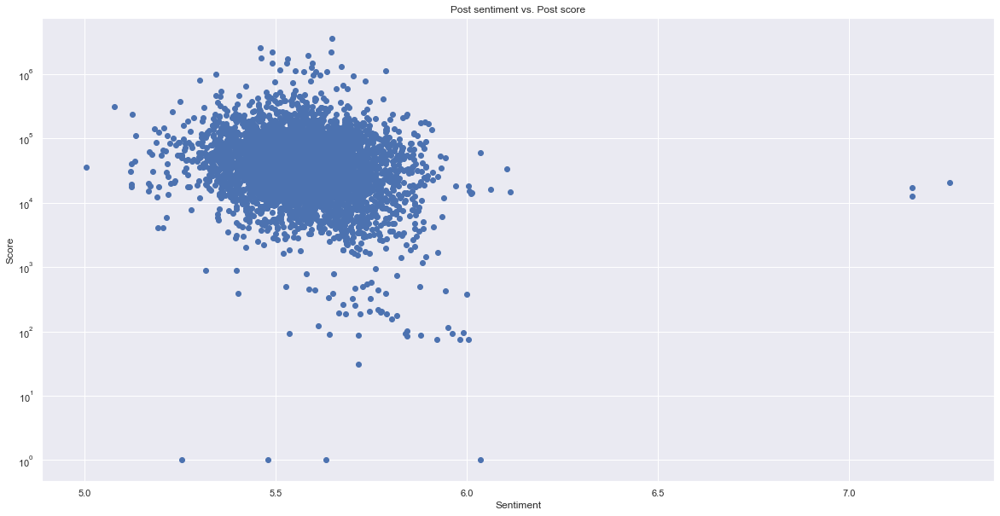

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="darkgrid")

fig = plt.figure(figsize=(20,10))
# Sentiment of the individual post. 
plt.scatter(sentimen_post, scores_post)
#We want to figure out if post with a general possitive tone (the comments in that post) is more likly to get a higher scorre. lt.scatter(sentimen_post, scores_post)
plt.title("Post sentiment vs. Post score")
plt.ylabel("Score")
plt.xlabel("Sentiment")


ax = fig.axes
ax[0].set_yscale('log')

plt.show()

We see that by taking the average sentiment for all the comments for each post we get a cluster around 5-6 in the sentiment score (1-10)

An interesting finding here is that of the top 50 posts for the top 100 subreddits, we don't see any post with a clearly negative sentiment. On the other hand, we actually see that there is a greater tendency for the post to have a generally more positive sentiment. The histogram below shows this right-skewed tendency.  

However, this result is flawed due to the way we collected our data. As we picked the most popular post for the last year we automatically excluded the post with lower scores. 

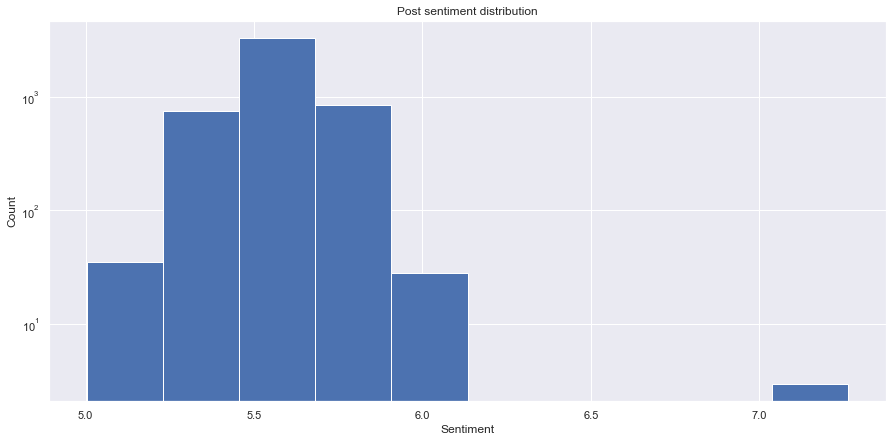

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set(style="darkgrid")

fig = plt.figure(figsize=(15,7))
plt.hist(sentimen_post)
plt.title("Post sentiment distribution")
plt.ylabel("Count")
plt.xlabel("Sentiment")
ax = fig.axes
ax[0].set_yscale('log')
    
plt.show()

## Sentiment of subreddits vs. Subreddit score

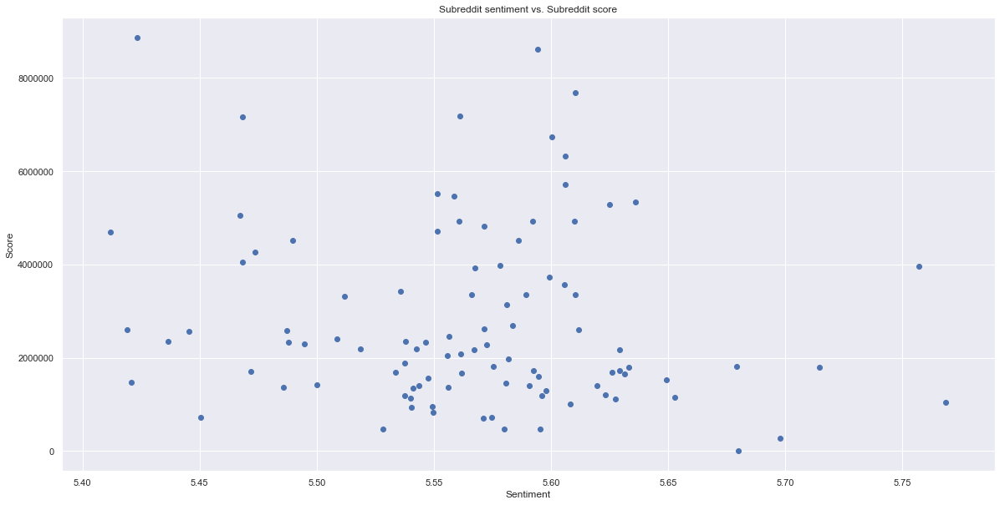

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="darkgrid")
fig = plt.figure(figsize=(20,10))
plt.scatter(sentimen_subreddit, scores_subreddit)
plt.title("Subreddit sentiment vs. Subreddit score")
plt.ylabel("Score")
plt.xlabel("Sentiment")

ax = fig.axes
plt.show()

We see the subreddits are spread more out in a shorter sentiment span. This result is expeced as the sentiment of a subreddit is and average of all the comments in the subreddit. 

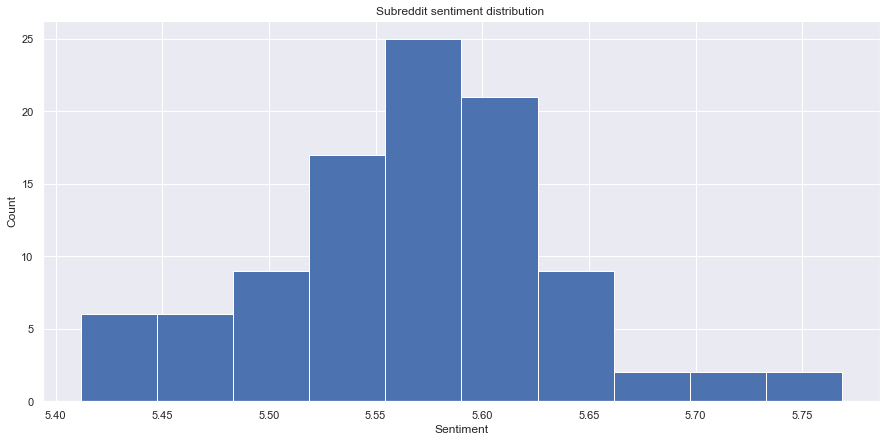

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set(style="darkgrid")

fig = plt.figure(figsize=(15,7))
plt.title("Subreddit sentiment distribution ")
plt.ylabel("Count")
plt.xlabel("Sentiment")
plt.hist(sentimen_subreddit)
#ax = fig.axes
#ax[0].set_yscale('log')
#ax[0].set_xscale('log')
    
plt.show()

We haven't been able to draw any conclusion about the influence of the users sentiment on the centrality in the graph. This is partly due to the extreame low centrality of the users. Our approch to the data collection have been flawed. We wanted to figure out if general positive post and subreddits where more likely to become popular. As we only picked the top post for the past year we exclude some important information - is unpopular post negative in sentiment? We did see that the popular post we selected had a general above average sentimemt, meaning that positive post are popular, we are however not able to say if a random sample of all post are possitive. 
The same thing is the case with the subreddits. We see a smaller span between the sentiments, but no one below 5.4. 

## Sentiment of communites
We will now show how the sentiment for the different communities within a certain subreddit. The below script was execuded for the seceted 10 subreddit presented on the website. 

The sentiment of the communities is calculated based on the users in that community. As with the other sentiment analysis the number of words a user have writen has influence on the overall sentiment. 

In [32]:
q = 0
tot = len(community.keys())
Sentiment_community = {}
for com in community.keys():
    if q % 10000 == 0:
        print( int(q/tot*100))

    users = community[com]['users']
    length = 0
    sentiment_user = 0
    for user in users:
        if user in user_sentiment.keys():
            sentiment_user += user_sentiment[user]['sentiment_comment']*user_sentiment[user]['length_comment']
            length += user_sentiment[user]['length_comment']
    q+=1
    community[com]['sentiment'] = sentiment_user/length       
    community[com]['length'] = length

    
with open('Sentiment_Community/users_communities-science.pickle', 'wb') as handle:
    pickle.dump(community, handle)        
        

0


In [34]:
community

{482: {'color': '#cf8936', 'sentiment': 5.584488529149397, 'length': 217408},
 14873: {'color': '#b78b1b', 'sentiment': 5.676305183837861, 'length': 3955},
 706: {'color': '#532906', 'sentiment': 5.554130531728577, 'length': 23873},
 13822: {'color': '#d28136', 'sentiment': 5.583991468852013, 'length': 5001},
 1172: {'color': '#a15e56', 'sentiment': 5.5871923626136715, 'length': 5050},
 5323: {'color': '#f334ff', 'sentiment': 5.560793998338181, 'length': 7551},
 3206: {'color': '#bfcd60', 'sentiment': 5.636989737934889, 'length': 8299},
 765: {'color': '#7eb608', 'sentiment': 5.53250007509639, 'length': 4144},
 3039: {'color': '#b100a2', 'sentiment': 5.61992224612438, 'length': 6114},
 5973: {'color': '#43b107', 'sentiment': 5.62143678740047, 'length': 3770},
 80519: {'color': '#045be3', 'sentiment': 5.584318910865921, 'length': 7023},
 4432: {'color': '#d9962f', 'sentiment': 5.5803908237848745, 'length': 5586},
 5567: {'color': '#037077', 'sentiment': 5.483130976611302, 'length': 5175

We have now found the sentiment of each of the selected communities. This will be compared with the sentiment for the subreddit the community is apart of to see if some communities can be caracterized as being more or less positive. 

## tf-idf
For the found communities, individual posts and users, we wanted to investigate which words occur frequently and are special for set groups.


tf-idf is a product of two statistics, being term frequency (tf) and inverse document frequency (idf) [\[4\]](#reference-4).


tf indicates the occurrences of a word featuring in a document and is given by:
$$\text{tf}_{i,j} = \dfrac{n_{i,j}} {\sum_k n_{i,j}}$$

Idf indicated the amount of information each word provides for the document.
This is used to distinguish between words that are common across all documents and words that are common for the specific document. The idf is calculated by the formula:
$$\text{idf}(w) = \log \left(\dfrac{N}{df_t}\right)$$

For each word in each document the tf and idf are multiplied resulting in a result where the higher the result the more important that word is for the document.

The reasoning for calculting the tf-idf's are to create wordclouds for the communities, the most positive and negative users and the most positive posts (Since there are no negaive posts, only positive will be made)

In [2]:
import pickle
from nltk.probability import FreqDist
import math

A pickle of tokenized user comments and network of the communities in a subreddit have been created earlier. These had to be combined in order to determine the tf-idf's.

In [145]:
# Read comments for each user
usercommentfile = open('tokenizedUserComments.pickle', 'rb')      
userComments = pickle.load(usercommentfile) 

In [238]:
# Read communities
file = open('communities-politics', 'rb')      
communities = pickle.load(file) 

In [239]:
# Combine communities with their corresponding comments
communityComments = {}
for key, value in communities.items():
    comments = []
    for user in value['users']:
        for word in userComments[user]:
            comments.append(word)
    communityComments[key] = comments

The FreqDist from the nltk library could be used to dertermine the tf's:

In [240]:
# Computing the TF
tf = {}
for key, value in communityComments.items():
    tf[key]=FreqDist(value)

The IDF is calculated by going through each word for every document (community for this example). The amount of occourences of the word in the document are then divided by the amount of documents (communities). The the logarithm of that quotient is then taken.

In [252]:
# Mehtod for calculating the IDF:
def CalcIDF(words, dictonary):
    current_idf = {}
    counts = {}
    for word in words:
        count = 0
        for key, value in dictonary.items():
            count += value[word]
            if count > 0:
                current_idf[word] = math.log(len(communities)/(count), 2)
    return current_idf

In [253]:
# Computing the IDF
idf = {}
for key in communityComments:
    idf[key] = CalcIDF(tf[key].keys(), tf)

Finally these values gets multiplied

In [254]:
# Mehtod for calculating the IDF:
def CalcTF_IDF(community):
    tf_idf = {}
    for word in communityComments[community]:
        tf_idf[word] = float(idf[community][word]*tf[community][word])
    return tf_idf

In [255]:
#Computing the TF-IDF
tf_idf = {}
for community in communityComments:
    tf_idf[community] = CalcTF_IDF(community)

In [245]:
with open('communities-politics_tf_idf.pickle', 'wb') as handle:
    pickle.dump(tf_idf, handle)

The same method is applied for the users (where each user is a document), and the posts (where each post is a document).

## Word clouds
With the tf-idf's in place word clouds can be generated for the communities, positive and negative users and positive posts:

In [33]:
#Generate word cloud
import random as rnd
import matplotlib.pyplot as plt
def GenerateWordCloud(tf_idf, title, mask = None, max_font_size = 60):
    from wordcloud import WordCloud
    
    text_words=[]
    for word, value in tf_idf.items():
        for i in range(int(value)):
            text_words.append(word)
    #shuffle to avoid the problem with repeating words
    rnd.shuffle(text_words)
    text = " ".join(text_words)

    # Display the generated image:
    wordcloud = WordCloud(max_font_size=max_font_size, background_color="white", max_words=100, mask = mask).generate(text)
    plt.figure(dpi=300)
    plt.title(title)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Word clouds for the communites:

In [36]:
dbcomment = open('communities-politics_tf_idf.pickle', 'rb')      
corpus = pickle.load(dbcomment) 

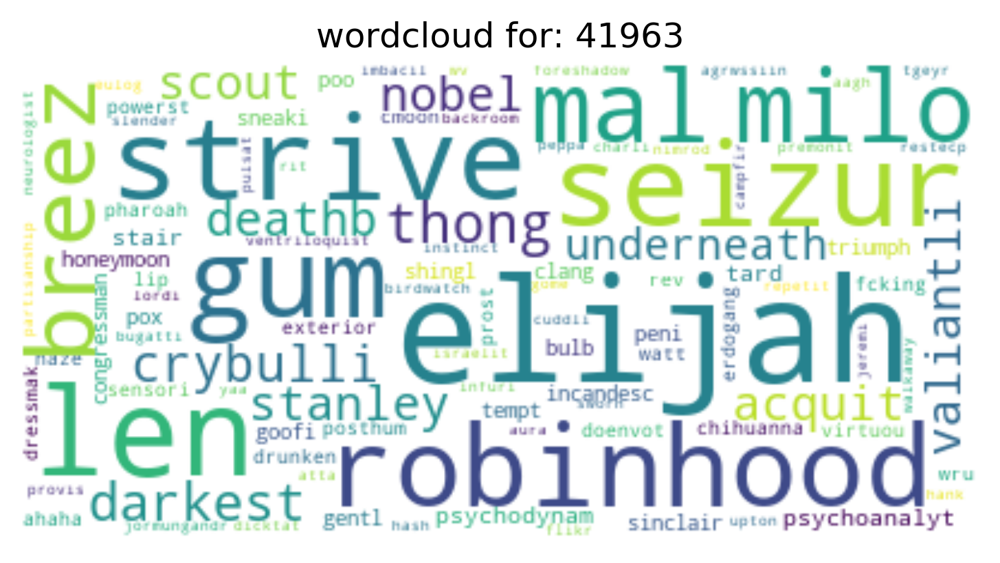

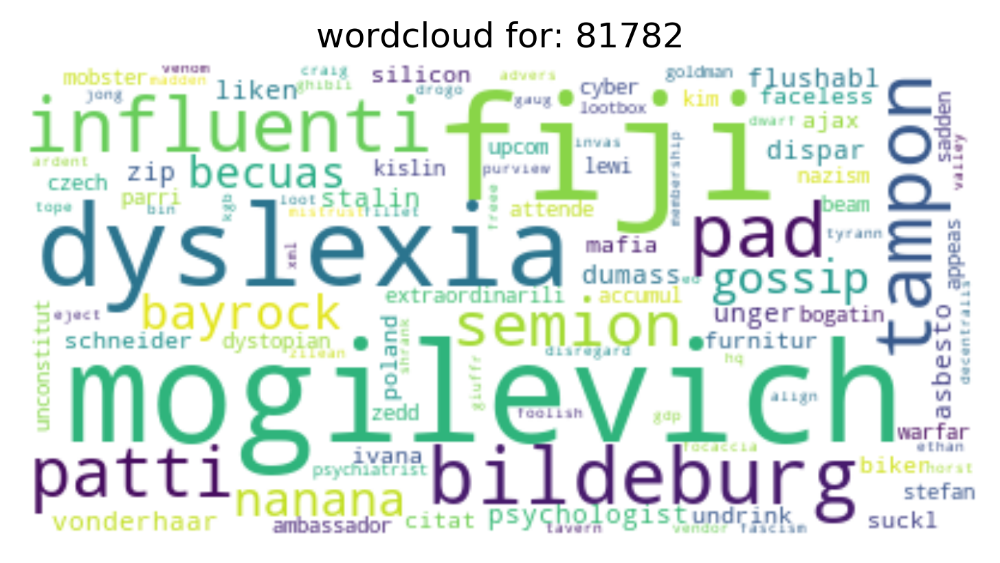

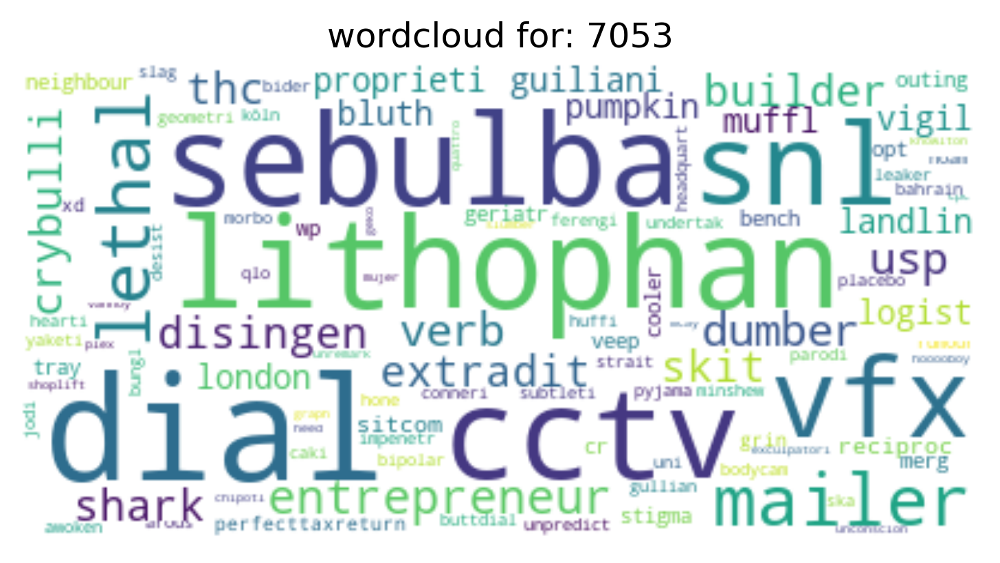

In [37]:
# Looping through the communities creating word clouds for each
maxWordCloudsToShow = 3
for book in corpus:
    GenerateWordCloud(corpus[book], 'wordcloud for: ' + str(book))
    maxWordCloudsToShow += -1
    if maxWordCloudsToShow == 0:
        break

Generally it is hard to determine what the common themes are for the communities.

Word clouds for the positive users:

In [19]:
dbcomment = open('positive_users_tf_idf.pickle', 'rb')      
corpus = pickle.load(dbcomment) 

The amount of words form each user is very low:

In [28]:
sum = 0
for user in corpus:
    sum += len(corpus[user])
print("average amount of words from each user: ", sum/len(corpus))

average amount of words from each user:  1.4986


The reason for this is alot of words without much saying have been removed (like stopwords)

To get something out of the user word clouds, the 5000 most positive users have been combined (same have been done to negative):

In [29]:
# Combining all the words into one list
booksIntoCorpus = []
for key, value in corpus.items():
    booksIntoCorpus.append(value)

In [30]:
# Taking care of duplicates and adding up their score
UniqueWords = {}
for comment in booksIntoCorpus:
    for word, value in comment.items():
        if word in UniqueWords:
            UniqueWords[word] = UniqueWords[word] + value
        else:
            UniqueWords[word] = value

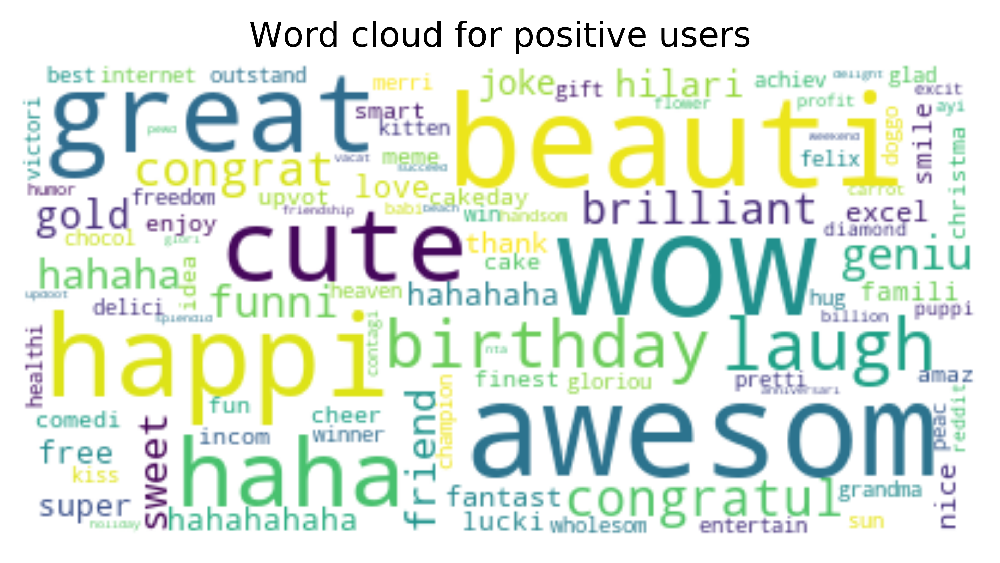

In [32]:
GenerateWordCloud(UniqueWords, "Word cloud for positive users")

As can be seen postive words strongly correlate with the users being positive, as expected

# 4. Critical reflection

#### Positives
We were capable to present a summary of the more active subreddits on Reddit, showing the users that are more central, how communities form within a subreddit and between them and relate all this to the sentiment of the content posted.

We found out that the sentiment of the most popular content in the most active subreddits is mostly equal. 

We saw some correlation between the centrality and the score of a user. 

#### Critiques
The type of scraping we perfomed is inherently biased. We have selected the top comments in the top posts of the most active subreddits in the last year. This meant that a lot of the controversial and perhaps more interesting behaviours of the communities are not captured.

The first hurdle we encountered was the size of the dataset. It proved to be impossible to handle with the instruments available to us. We sized the dataset down from 300 to 100 subreddits, but still had issues in running the analysis, the critical steps required use of C++ to get the 

#### Eigenvector centrality:
The Eigenvector centrality algorithm was used to find the centrality of the users in the graph instead of the betweeness centrality. This was partly due to the computation power available, as the between centrality took to long to compute. It would have been interresting to compare the betweenness centrality with the eigenvector centrality. 
The eigenvector centrality is based on how important your neigbours are in the network but as the number of people who are very "unimportant" the chance that you get a high number of "unimportant" neigbours increases. We therefore got a result where almost every user had an extreamly low centrality. The couple of users with a centrality higher than 0.4 where interconnected around the DotA2 subreddit. These guys (of course it was guys) do not have an extreme number of neigbours in the 1. of 2. shell compared to a random sample of users, but they do have the "right" kind of neigbours. If we had used the betweenness centrality, that are based on the shortest path algorithm, we would probably have seen that people in hubs were more central and we would see a bigger span between the centrality of people. 

#### Sentiment analysis:
In the sentiment analysis we stemmed the reference list and the comments to get the shortest version of the individual word. We also tried to run the sentiment on the unstemmed list and comments. The results where almost the same, we however saw that some words that had the same meaning but where plural didn't get included in the sentiment. The stemmed words did course some issues with the wordclouds as many word had wierd endings, but this was ignored. 

If we have had more time in this project we would have prioitized to calculate in a more detailed maner. We would have used a trained sentiment analysis model to get more precise results where context of the word is taken into consideration. 

We also didn't have time to investigate the sentiments of the emojies posted in the comments. As more and more people express there mood using small yellow figures you could get more accurate sence of what users think about a certain subject etc. 

#### If we were to do this again...
One last comment is that if we were to do this again, we would probably change our choice of gathering data from the top content of the last year. Instead, we would gathere all new posts for a certain period of time and track their performance, gathering new comments as they are being posted. This would be almost impossible with normal computers, and maybe would be more realistic to focus on one or maybe a couple of interesting subreddits (for example in the context of the upcoming 2020 american elections or maybe the community around a popular videogame which thrives thanks to community interaction).

# 5. Contributions

Morten focused on the website, on the TF-IDF and wordcloud creation.

Sebastian focused on the basic stats of the network, centrality scores and sentiment analysis.

Samuele focused on the data cleaning, graph creation and community detection and analysis using link communities.




# References

<a name="reference-1"></a>\[1\] Ahn, Yong-Yeol, James P. Bagrow, and Sune Lehmann. "Link communities reveal multiscale complexity in networks." nature 466.7307 (2010): 761.
 
<a name="reference-2"></a>\[2\] Barabási, Albert-László. "Network science book." Network Science 625 (2014).

<a name="reference-3"></a>\[3\] Wikipedia contributors. "Degeneracy (graph theory)." Wikipedia, The Free Encyclopedia. Wikipedia, The Free Encyclopedia, 23 Nov. 2019. Web. 9 Dec. 2019. https://en.wikipedia.org/wiki/Degeneracy_(graph_theory)#k-Cores

<a name="reference-4"></a>\[4\] Wikipedia contributors. "Tf–idf." Wikipedia, The Free Encyclopedia. Wikipedia, The Free Encyclopedia, 4 Dec. 2019. Web. 9 Dec. 2019. https://en.wikipedia.org/wiki/Tf%E2%80%93idf